# Feature  extraction for Audio Authentication
We will used librosa  libraray for audio processing  and feature extraction .

In [ ]:
import matplotlib.pyplot as plt
from scipy.io import wavfile
%matplotlib inline
import numpy as np
import IPython.display as ipd
import librosa
import librosa.display
import scipy
import sklearn
import pandas as pd
import base64
import wave
from wave import open as open_wave

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

.load  of lib rosa loads an audio file and decodes it into a 1-dimensional array which is a time series x , and sr is a sampling rate of x . sampling rate in our audio is 22050 , We  have 40 authentic audio sample and  40 imposter audio signal. 

In [ ]:
#AJ's Voice Samples
AJ_audio = "C:/Users/Ajinkya/Downloads/Voice Authentication Project/AJ/"
audio_list1 = librosa.util.find_files(AJ_audio, ext=['wav']) #audio_list1 contails name of all imposter  files 

# Now lets  create a dataframe  to save extraced features   we will be extracting  following  features. 
<br>Average of audio signal
<br>Standard deviation 
<br>zerocrossings
<br>Spectral centroids
<br>Spectral roll off
<br>MFCCS Mel-Frequency Cepstral Coefficients(first 14 MFC)

In [ ]:
data=np.zeros([80,20]); # size of feature matrix will be  80 rows(40 auth,40 imposter )  columns (20  one for id and 19 for features)
# create empty data frame
featuredf  = pd.DataFrame(data, columns = ['User', 'Average', 'std', 'zcr', 'centroid', 'rollof', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc4', 'mfcc5', 'mfcc6', 'mfcc7', 'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11', 'mfcc12', 'mfcc13', 'mfcc14'])
featuredf.iloc[0:40,0]='AJ';
featuredf.iloc[40:80,0]='Imposter';
featuredf.tail(5)  # print part of data frame

,User,Average,std,zcr,centroid,rollof,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14
75,Imposter,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
76,Imposter,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
77,Imposter,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
78,Imposter,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
79,Imposter,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


 #### code  to to read  40 auth files and save them to csv 

In [ ]:
#AJ's 40-Voice samples extracted to CSV file
wD = []
for audio in audio_list1:
    fileWave = open_wave(audio,'rb') 
    wframes = fileWave.getnframes() 
    waveFrames = fileWave.readframes(wframes) 
    waveData = np.frombuffer(waveFrames)
    wD.append(waveData)
df1 = pd.DataFrame(wD)
df2 = df1.transpose()
df2.replace(np.nan, 0)
#define the coloumns of dataframe  40 coloumn  one for each auth audio amplitude
df2.columns=['Amplitude 1', 'Amplitude 2', 'Amplitude 3', 'Amplitude 4', 'Amplitude 5', 'Amplitude 6', 'Amplitude 7', 'Amplitude 8', 'Amplitude 9', 'Amplitude 10',
                     'Amplitude 11', 'Amplitude 12', 'Amplitude 13', 'Amplitude 14', 'Amplitude 15', 'Amplitude 16', 'Amplitude 17', 'Amplitude 18', 'Amplitude 19', 'Amplitude 20',
                     'Amplitude 21', 'Amplitude 22', 'Amplitude 23', 'Amplitude 24', 'Amplitude 25', 'Amplitude 26', 'Amplitude 27', 'Amplitude 28', 'Amplitude 29', 'Amplitude 30',
                     'Amplitude 31', 'Amplitude 32', 'Amplitude 33', 'Amplitude 34', 'Amplitude 35', 'Amplitude 36', 'Amplitude 37', 'Amplit3ude 38', 'Amplitude 39', 'Amplitude 40']
df3 = df2.replace(np.nan, 0)
df3.to_csv("Amplitude AJ.csv", header=True, index=False)

### graph 40 auth audio sample   in time domain 

<ipython-input-45-120924d0065c>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(14,5))


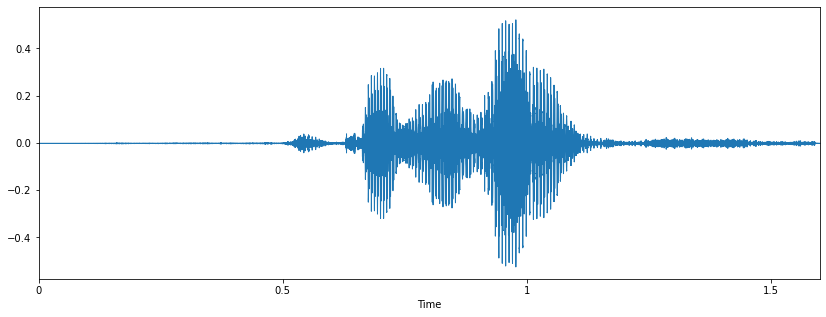

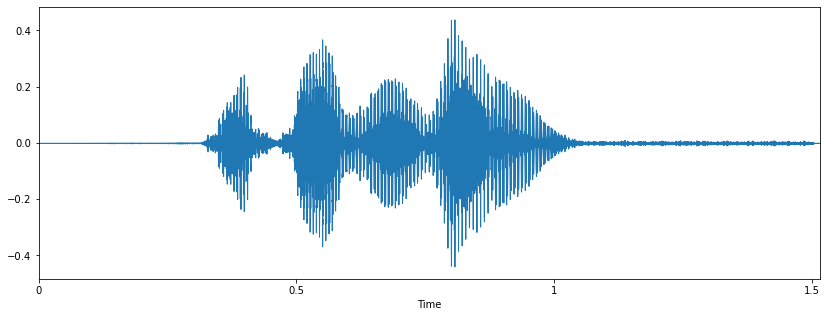

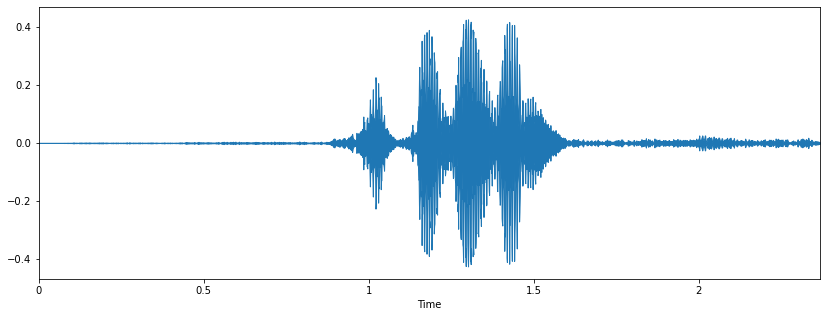

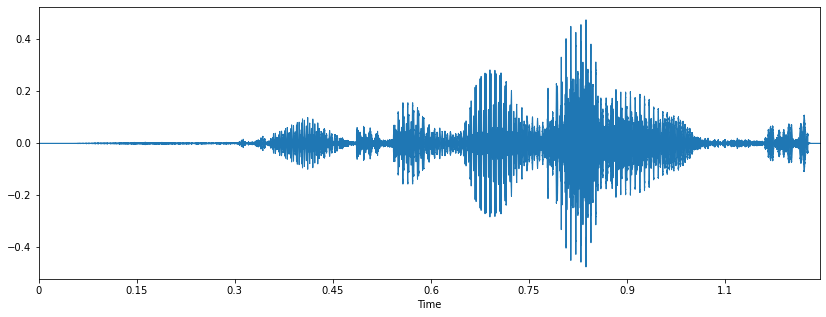

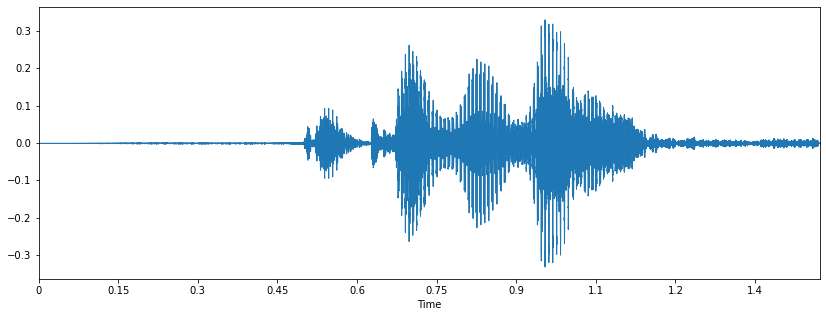

...

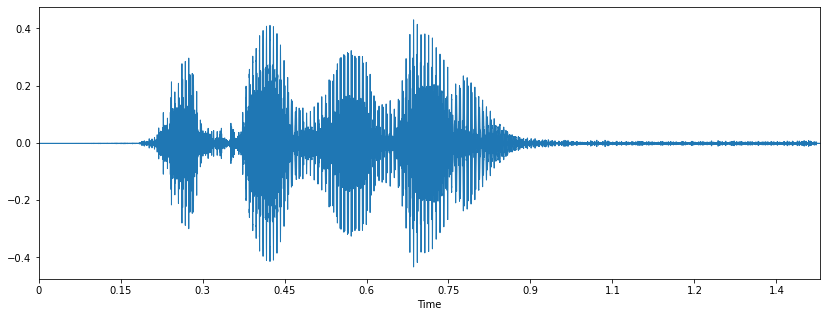

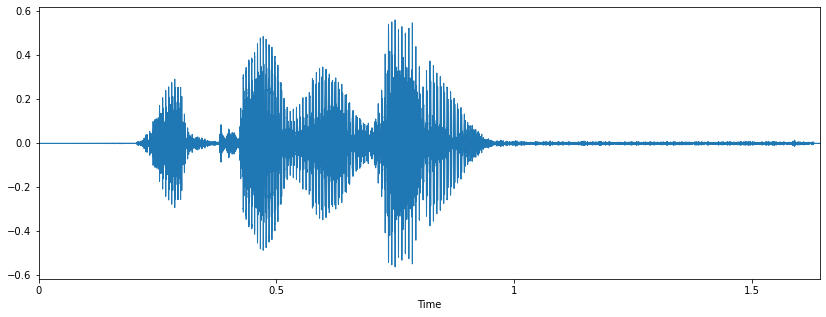

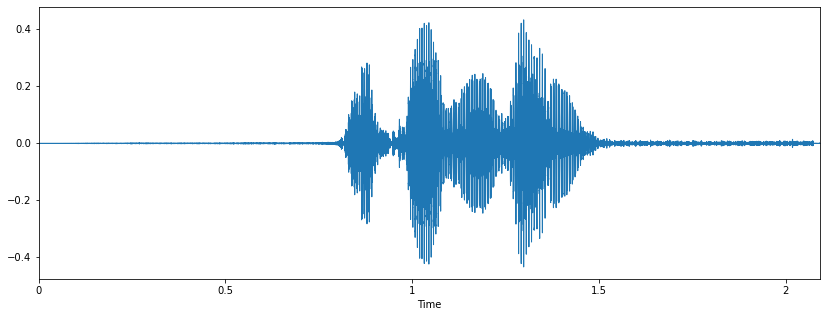

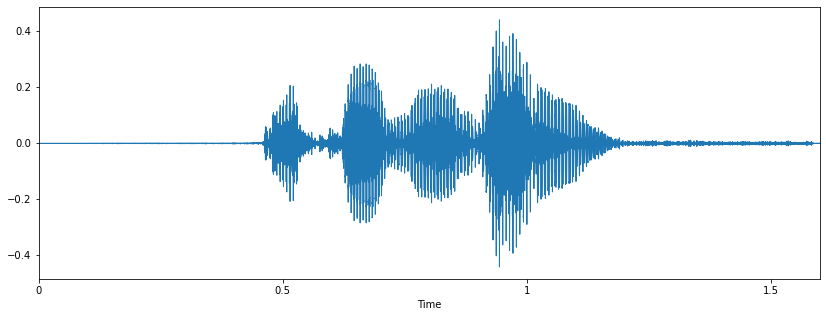

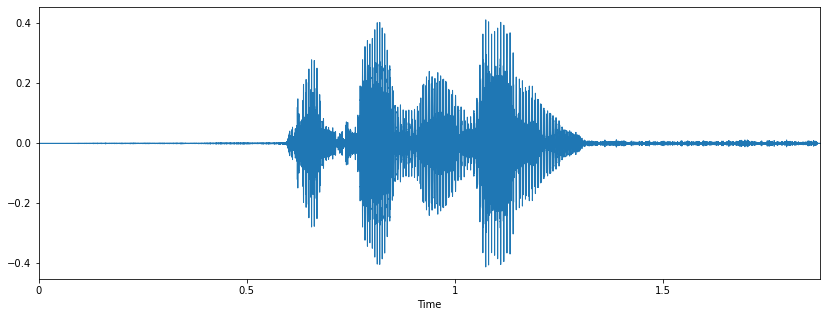

In [ ]:
#AJ's - 40-Separate graphs of all samples
for audio in audio_list1:
    plt.figure(figsize=(14,5))
    data,sample_rate=librosa.load(audio)
    librosa.display.waveplot(data,sr=sample_rate)
    ipd.Audio(audio)

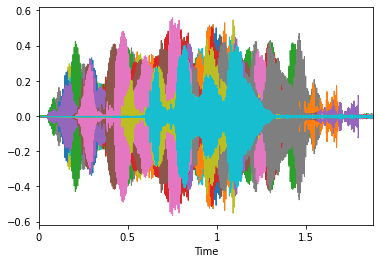

In [ ]:
#AJ's - 40-combined graph of all samples
for y in audio_list1: 
    data = librosa.load(y,mono = True)   
    data = data[0]     
    librosa.display.waveplot(data)

Load data for   40 imposter audio.

In [ ]:
#Imposter'ss Voice Samples
imposter_Audio = "C:/Users/Ajinkya/Downloads/Voice Authentication Project/Imposter/"
audio_list2 = librosa.util.find_files(imposter_Audio, ext=['wav'])   #audio_list2 contails name of all imposter  files 

 #### code  to to read  40 imposter files and save them to csv 

In [ ]:
wD1 = []
for audio in audio_list2:
    fileWave = open_wave(audio,'rb') 
    wframes = fileWave.getnframes() 
    waveFrames = fileWave.readframes(wframes) 
    waveData = np.frombuffer(waveFrames)
    wD1.append(waveData)
imposter_df1 = pd.DataFrame(wD1)
imposter_df2 = imposter_df1.transpose()
imposter_df2.replace(np.nan, 0)
imposter_df2.columns=['Amplitude 1', 'Amplitude 2', 'Amplitude 3', 'Amplitude 4', 'Amplitude 5', 'Amplitude 6', 'Amplitude 7', 'Amplitude 8', 'Amplitude 9', 'Amplitude 10',
                     'Amplitude 11', 'Amplitude 12', 'Amplitude 13', 'Amplitude 14', 'Amplitude 15', 'Amplitude 16', 'Amplitude 17', 'Amplitude 18', 'Amplitude 19', 'Amplitude 20',
                     'Amplitude 21', 'Amplitude 22', 'Amplitude 23', 'Amplitude 24', 'Amplitude 25', 'Amplitude 26', 'Amplitude 27', 'Amplitude 28', 'Amplitude 29', 'Amplitude 30',
                     'Amplitude 31', 'Amplitude 32', 'Amplitude 33', 'Amplitude 34', 'Amplitude 35', 'Amplitude 36', 'Amplitude 37', 'Amplit3ude 38', 'Amplitude 39', 'Amplitude 40']
imposter_df3 = imposter_df2.replace(np.nan, 0)
imposter_df3.to_csv("C:/Users/Ajinkya/Downloads/Voice Authentication Project/Imposter/Amplitude Imposter40.csv", header=True, index=False)

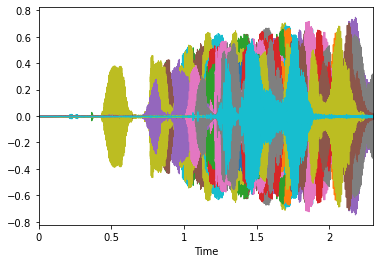

In [ ]:
#Imposter's - combined graph of all samples
for y in audio_list2: 
    data = librosa.load(y,mono = True)   
    data = data[0]     
    librosa.display.waveplot(data)

time plots of  all 40 imposter signals

<ipython-input-50-ff37e99626b0>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


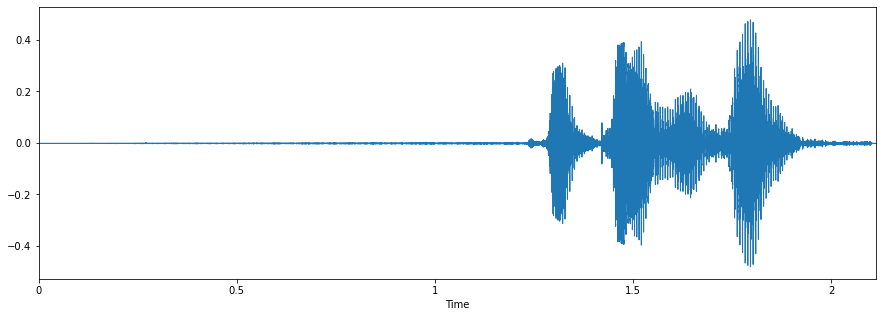

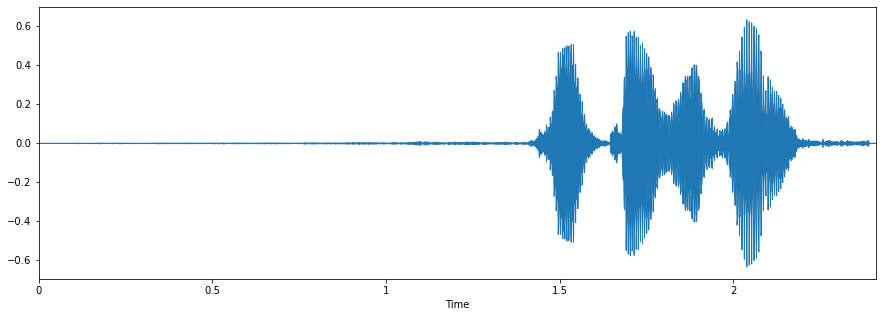

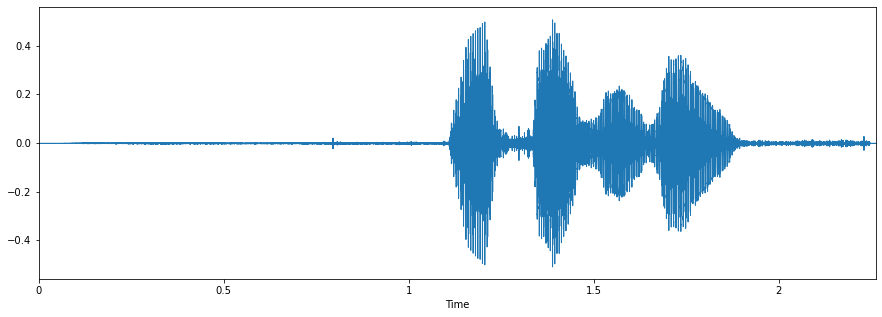

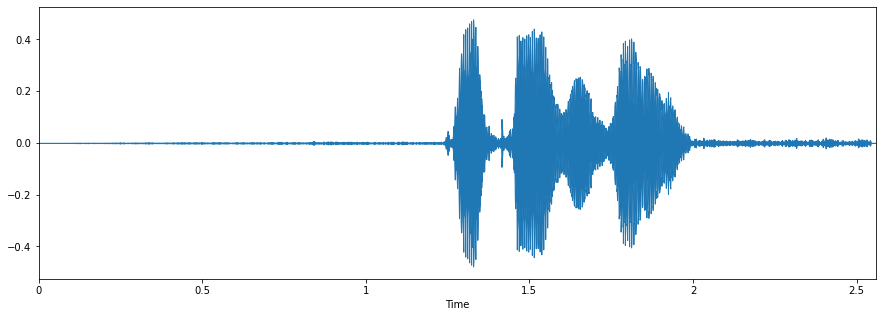

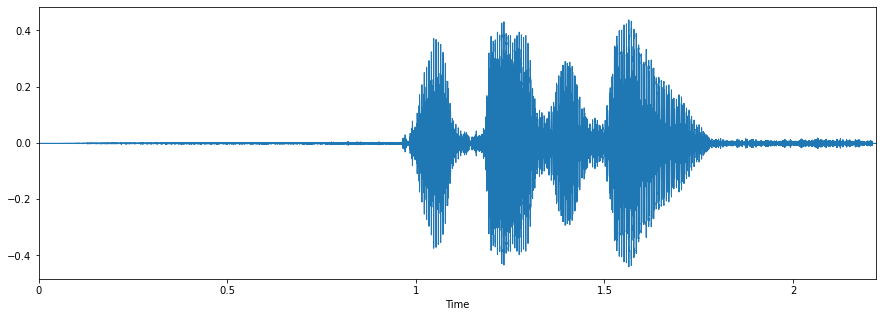

...

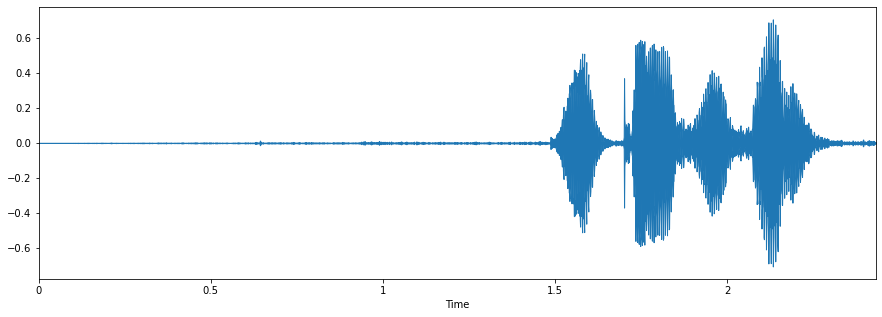

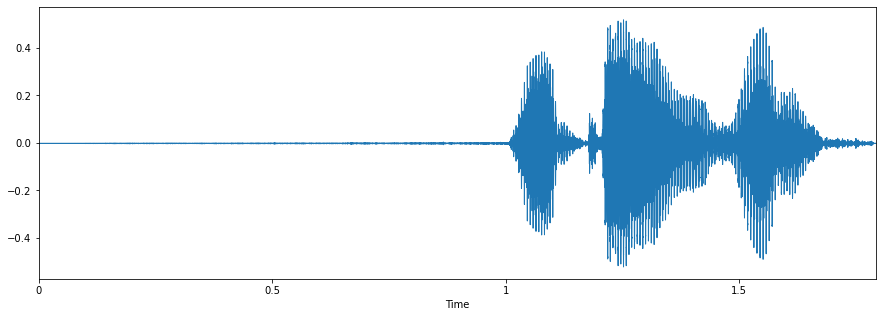

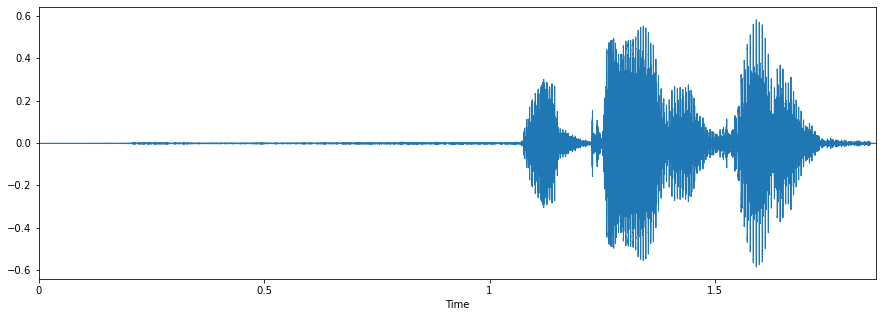

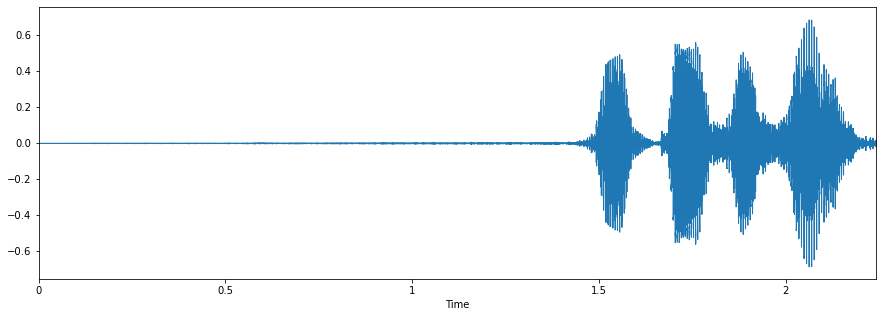

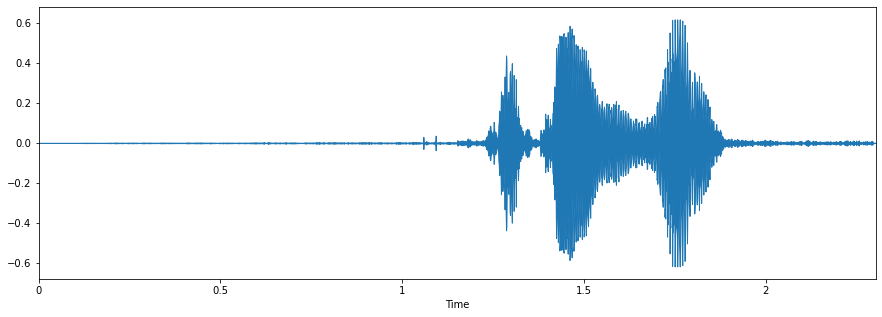

In [ ]:
#Imposter's - Separate graphs of all samples
for audio in audio_list2:
    plt.figure(figsize=(15,5))
    data,sample_rate=librosa.load(audio)
    librosa.display.waveplot(data,sr=sample_rate)
    ipd.Audio(audio)

time and frequencey  anylsis uf authentic speaker  data

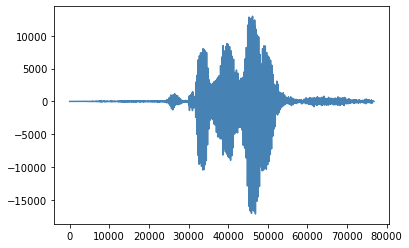

<Figure size 432x288 with 0 Axes>

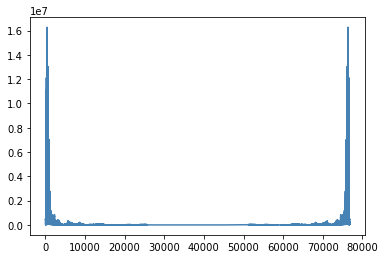

<Figure size 432x288 with 0 Axes>

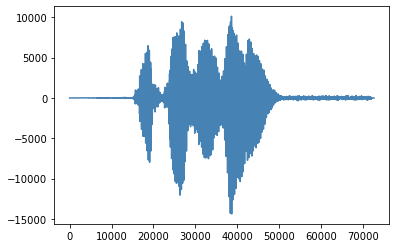

<Figure size 432x288 with 0 Axes>

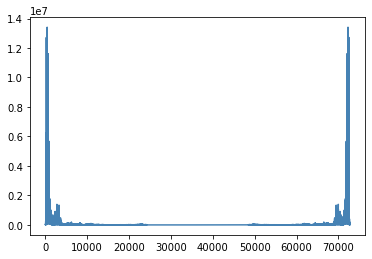

<Figure size 432x288 with 0 Axes>

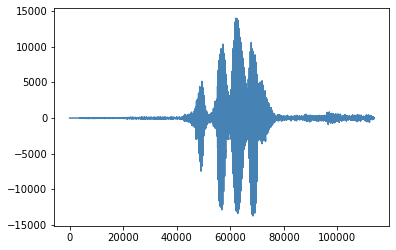

<Figure size 432x288 with 0 Axes>

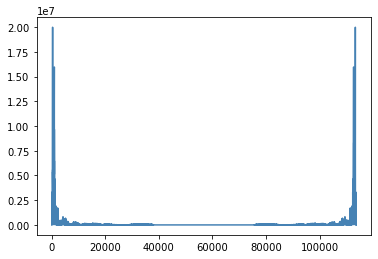

<Figure size 432x288 with 0 Axes>

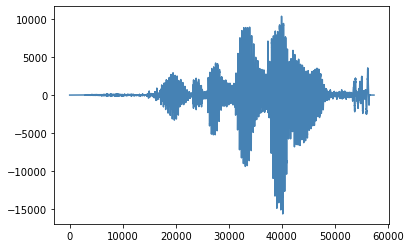

<Figure size 432x288 with 0 Axes>

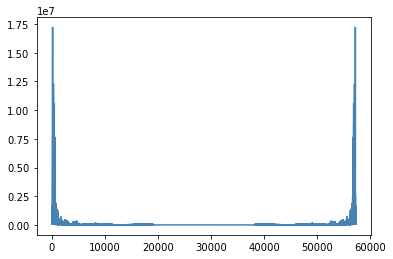

<Figure size 432x288 with 0 Axes>

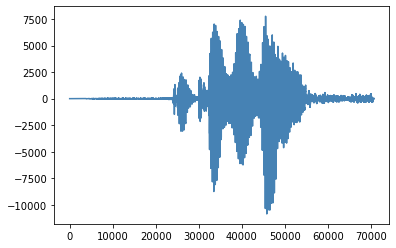

<Figure size 432x288 with 0 Axes>

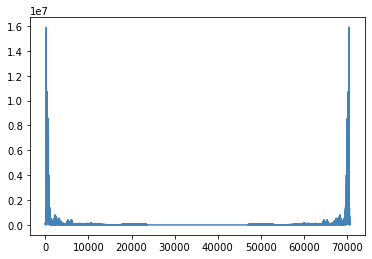

<Figure size 432x288 with 0 Axes>

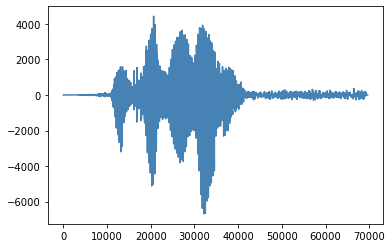

<Figure size 432x288 with 0 Axes>

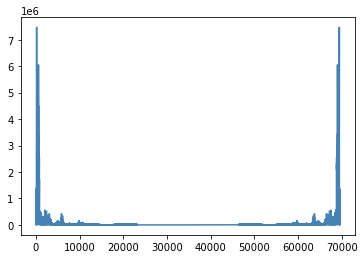

<Figure size 432x288 with 0 Axes>

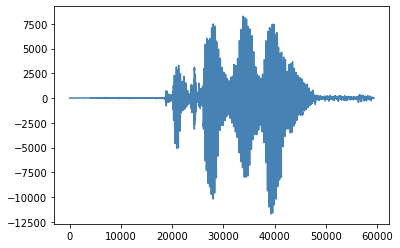

<Figure size 432x288 with 0 Axes>

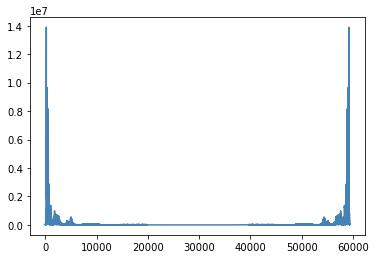

<Figure size 432x288 with 0 Axes>

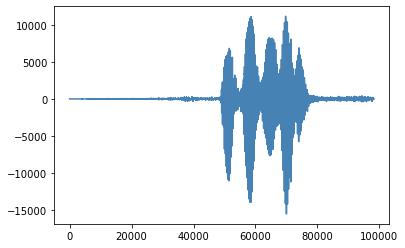

<Figure size 432x288 with 0 Axes>

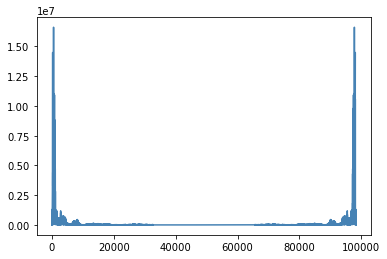

<Figure size 432x288 with 0 Axes>

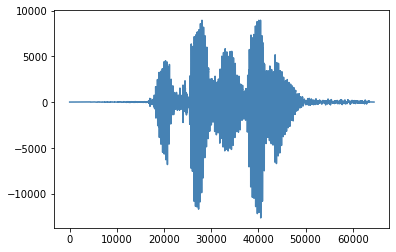

<Figure size 432x288 with 0 Axes>

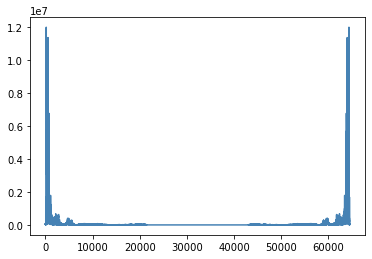

<Figure size 432x288 with 0 Axes>

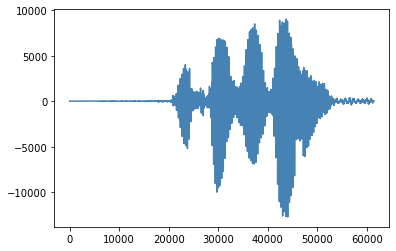

<Figure size 432x288 with 0 Axes>

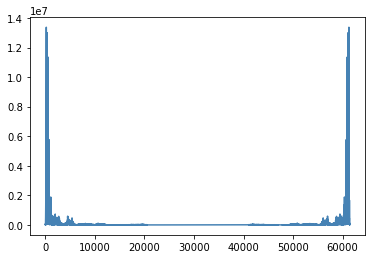

<Figure size 432x288 with 0 Axes>

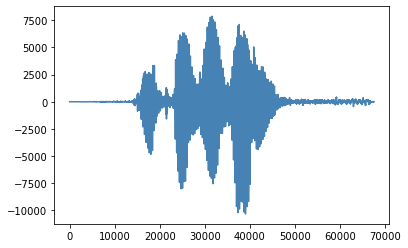

<Figure size 432x288 with 0 Axes>

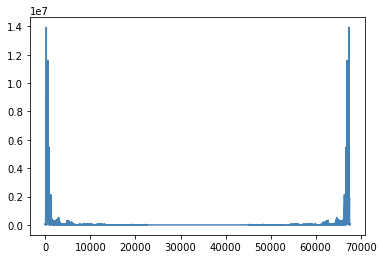

<Figure size 432x288 with 0 Axes>

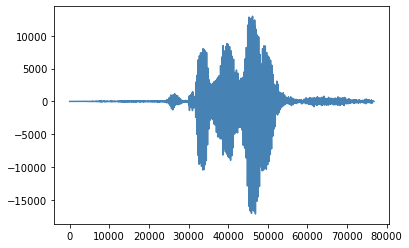

<Figure size 432x288 with 0 Axes>

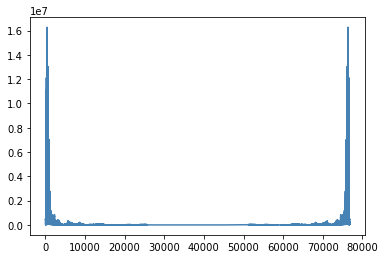

<Figure size 432x288 with 0 Axes>

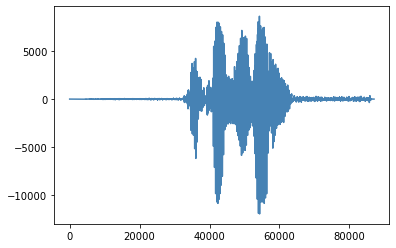

<Figure size 432x288 with 0 Axes>

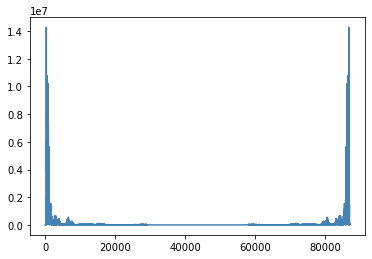

<Figure size 432x288 with 0 Axes>

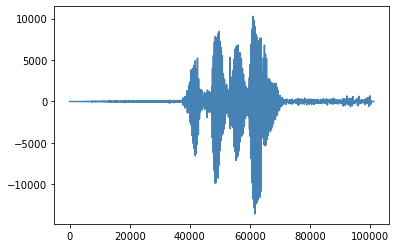

<Figure size 432x288 with 0 Axes>

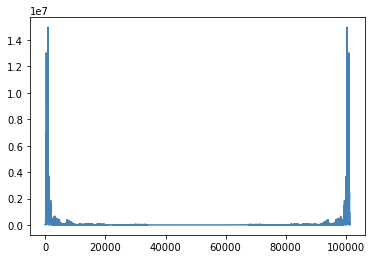

<Figure size 432x288 with 0 Axes>

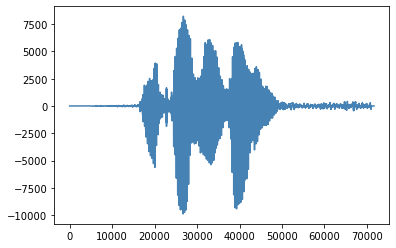

<Figure size 432x288 with 0 Axes>

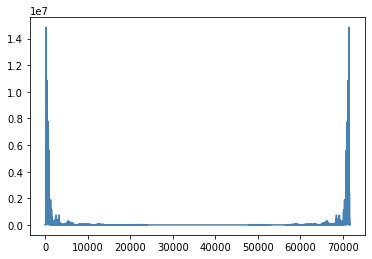

<Figure size 432x288 with 0 Axes>

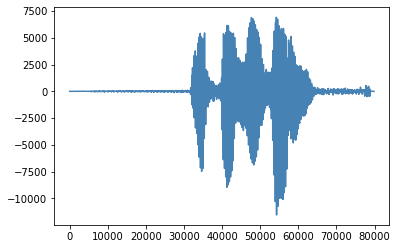

<Figure size 432x288 with 0 Axes>

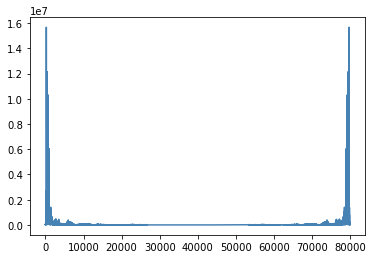

<Figure size 432x288 with 0 Axes>

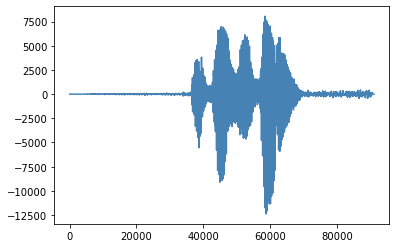

<Figure size 432x288 with 0 Axes>

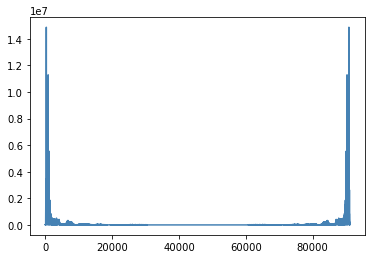

<Figure size 432x288 with 0 Axes>

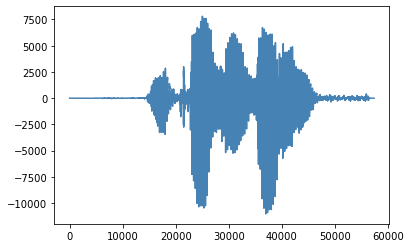

<Figure size 432x288 with 0 Axes>

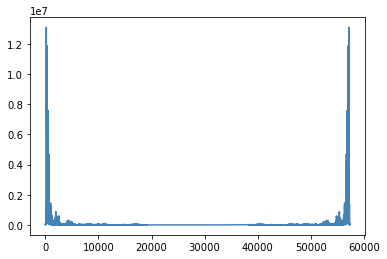

<Figure size 432x288 with 0 Axes>

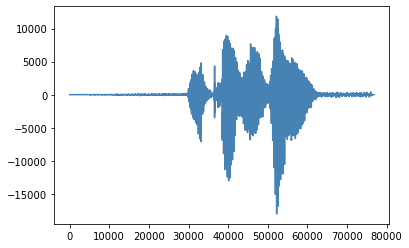

<Figure size 432x288 with 0 Axes>

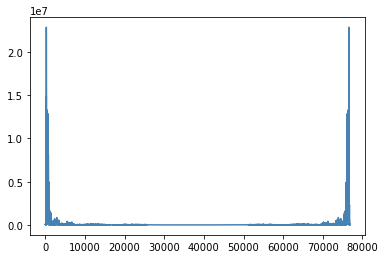

<Figure size 432x288 with 0 Axes>

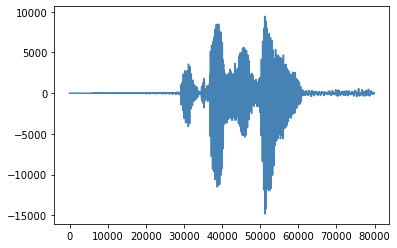

<Figure size 432x288 with 0 Axes>

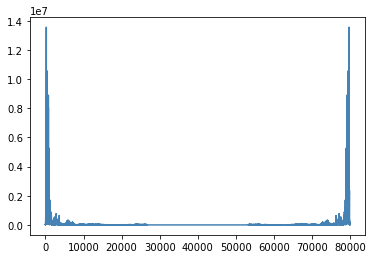

<Figure size 432x288 with 0 Axes>

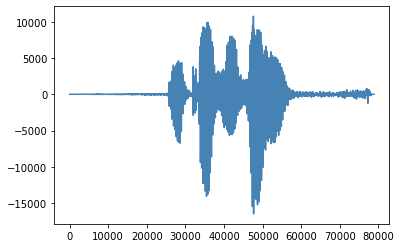

<Figure size 432x288 with 0 Axes>

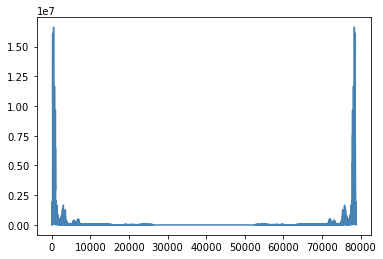

<Figure size 432x288 with 0 Axes>

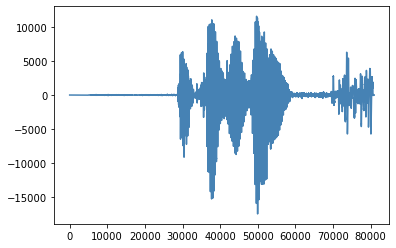

<Figure size 432x288 with 0 Axes>

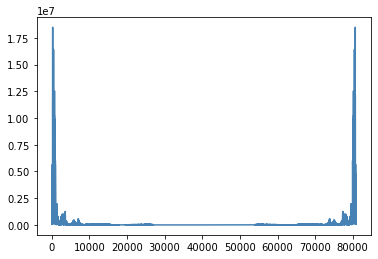

<Figure size 432x288 with 0 Axes>

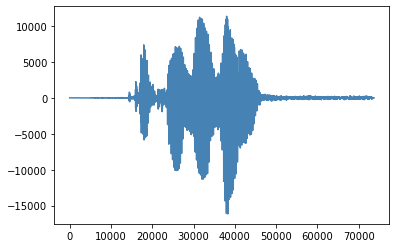

<Figure size 432x288 with 0 Axes>

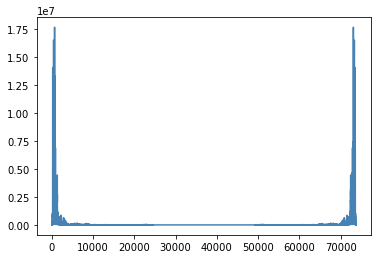

<Figure size 432x288 with 0 Axes>

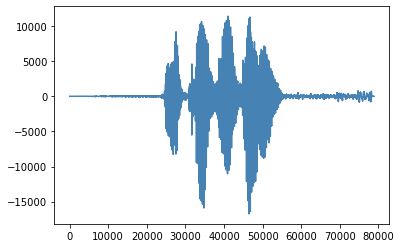

<Figure size 432x288 with 0 Axes>

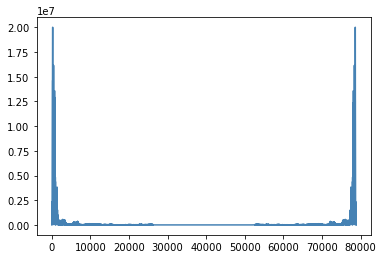

<Figure size 432x288 with 0 Axes>

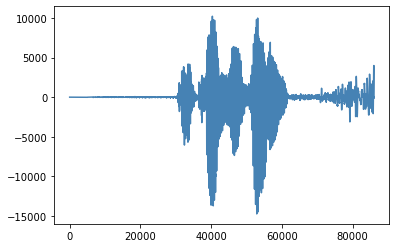

<Figure size 432x288 with 0 Axes>

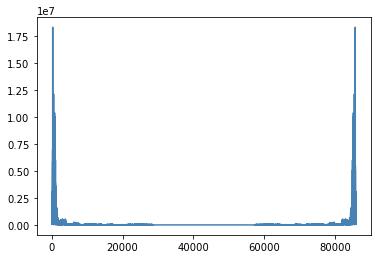

<Figure size 432x288 with 0 Axes>

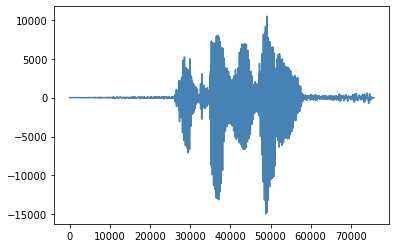

<Figure size 432x288 with 0 Axes>

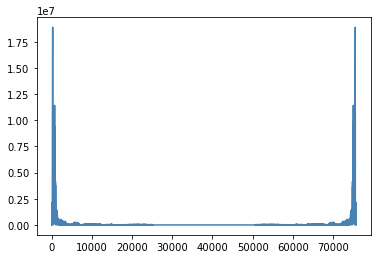

<Figure size 432x288 with 0 Axes>

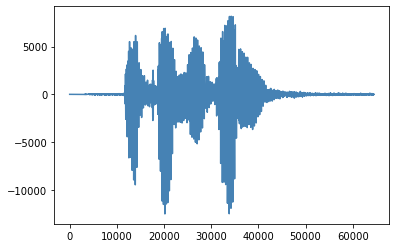

<Figure size 432x288 with 0 Axes>

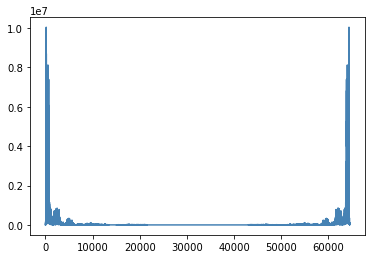

<Figure size 432x288 with 0 Axes>

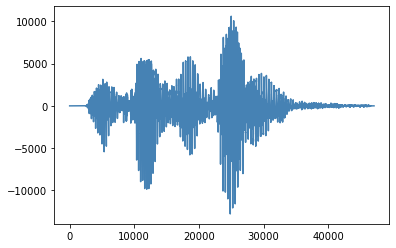

<Figure size 432x288 with 0 Axes>

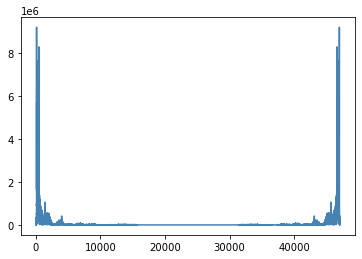

<Figure size 432x288 with 0 Axes>

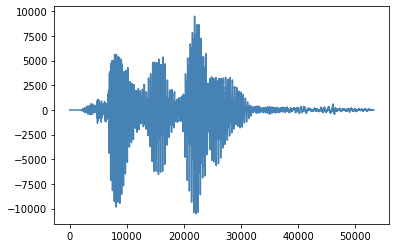

<Figure size 432x288 with 0 Axes>

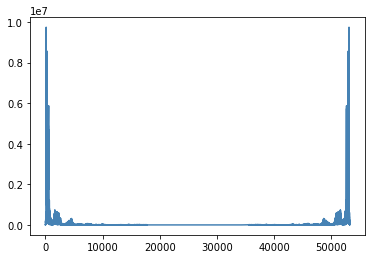

<Figure size 432x288 with 0 Axes>

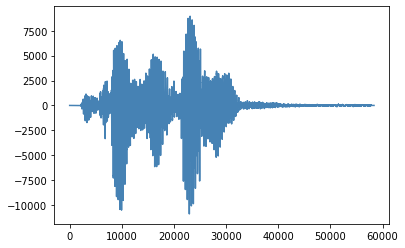

<Figure size 432x288 with 0 Axes>

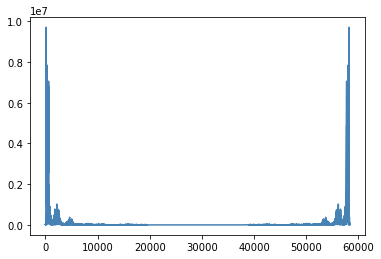

<Figure size 432x288 with 0 Axes>

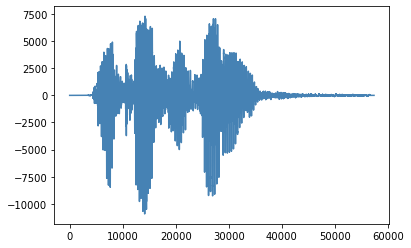

<Figure size 432x288 with 0 Axes>

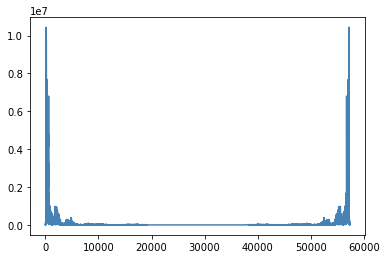

<Figure size 432x288 with 0 Axes>

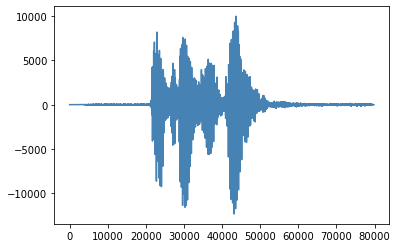

<Figure size 432x288 with 0 Axes>

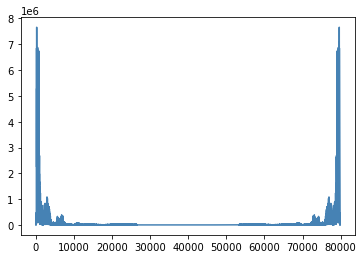

<Figure size 432x288 with 0 Axes>

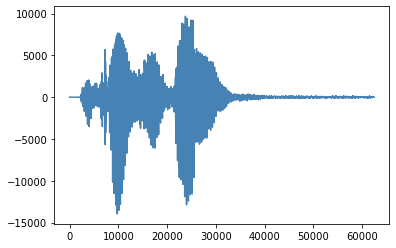

<Figure size 432x288 with 0 Axes>

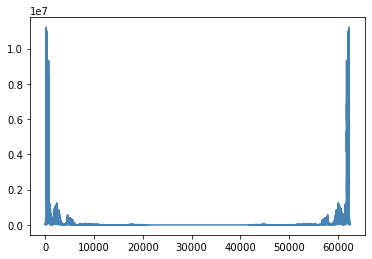

<Figure size 432x288 with 0 Axes>

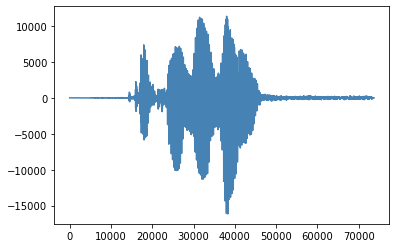

<Figure size 432x288 with 0 Axes>

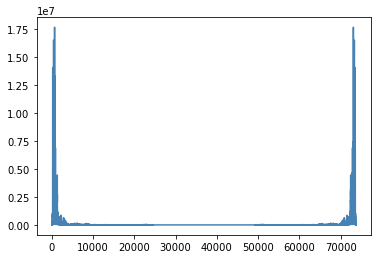

<Figure size 432x288 with 0 Axes>

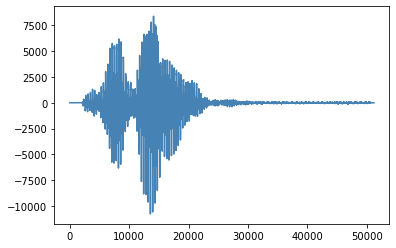

<Figure size 432x288 with 0 Axes>

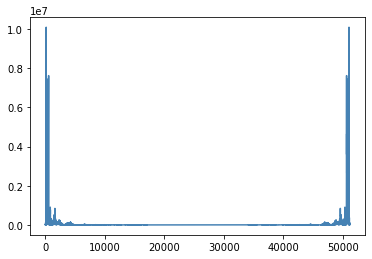

<Figure size 432x288 with 0 Axes>

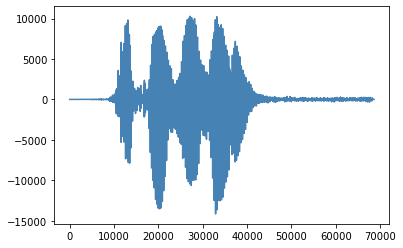

<Figure size 432x288 with 0 Axes>

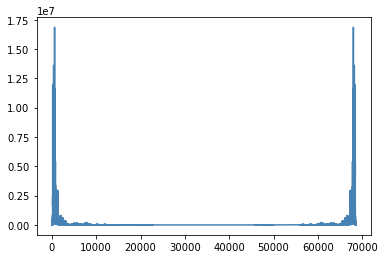

<Figure size 432x288 with 0 Axes>

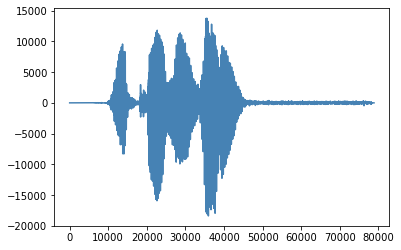

<Figure size 432x288 with 0 Axes>

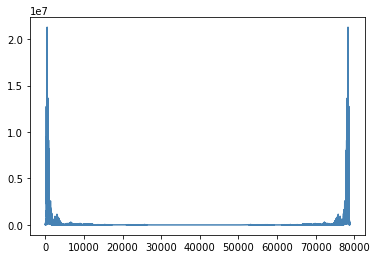

<Figure size 432x288 with 0 Axes>

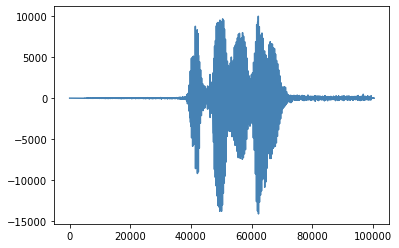

<Figure size 432x288 with 0 Axes>

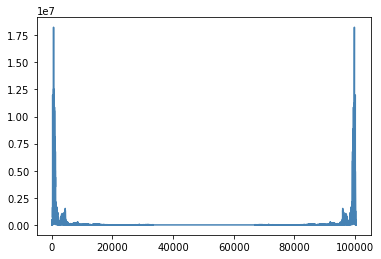

<Figure size 432x288 with 0 Axes>

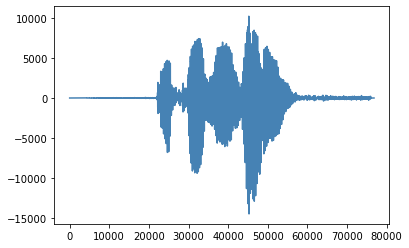

<Figure size 432x288 with 0 Axes>

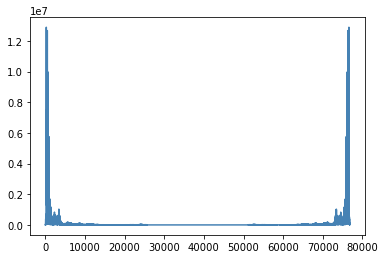

<Figure size 432x288 with 0 Axes>

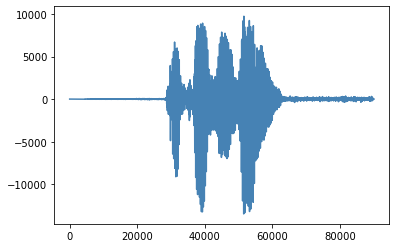

<Figure size 432x288 with 0 Axes>

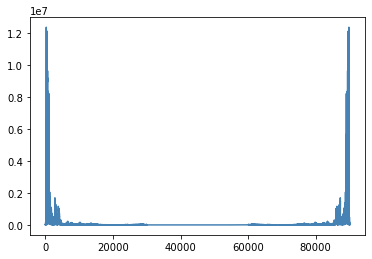

<Figure size 432x288 with 0 Axes>

In [ ]:
#FFT for AJ's voice samples
def plot(data):
    plt.plot(data, color='steelblue')
    plt.figure()
    plt.show()
for audio in audio_list1:
    rate, wav_data = wavfile.read(audio)
    plot(wav_data)
    plot(np.abs(np.fft.fft(wav_data)))

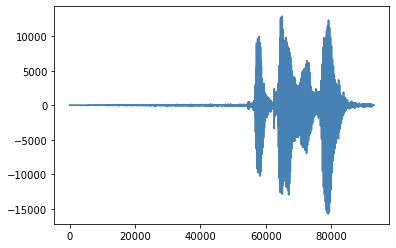

<Figure size 432x288 with 0 Axes>

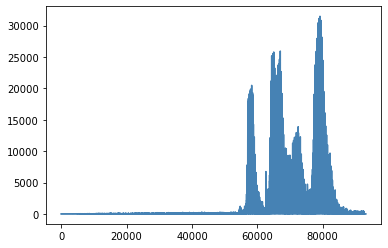

<Figure size 432x288 with 0 Axes>

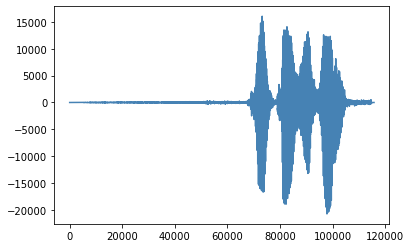

<Figure size 432x288 with 0 Axes>

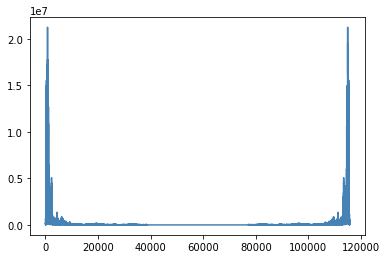

<Figure size 432x288 with 0 Axes>

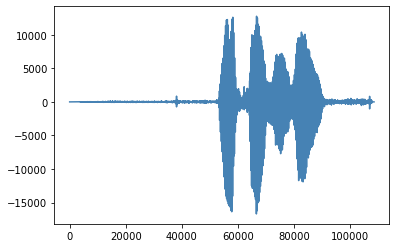

<Figure size 432x288 with 0 Axes>

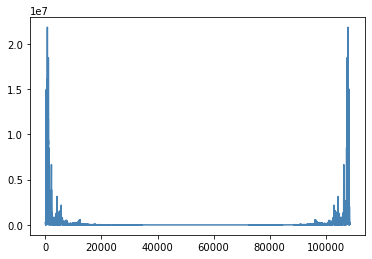

<Figure size 432x288 with 0 Axes>

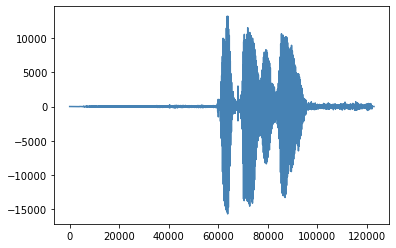

<Figure size 432x288 with 0 Axes>

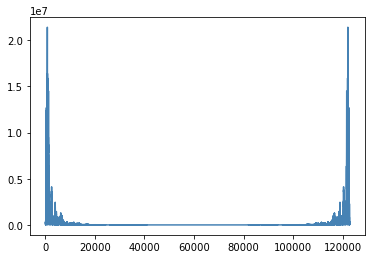

<Figure size 432x288 with 0 Axes>

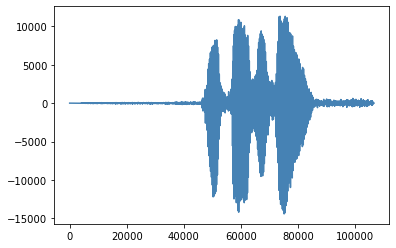

<Figure size 432x288 with 0 Axes>

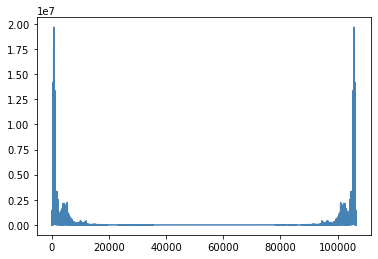

<Figure size 432x288 with 0 Axes>

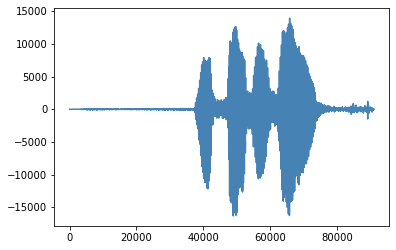

<Figure size 432x288 with 0 Axes>

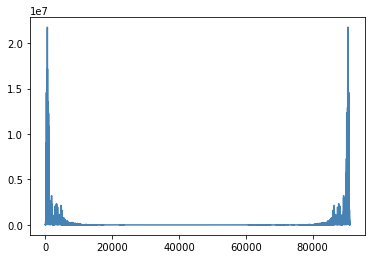

<Figure size 432x288 with 0 Axes>

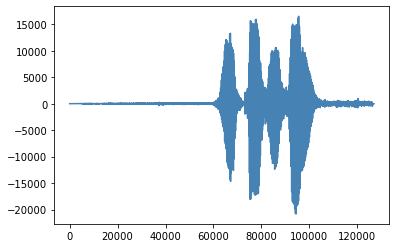

<Figure size 432x288 with 0 Axes>

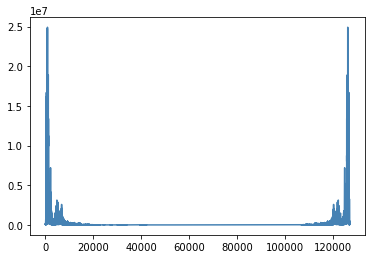

<Figure size 432x288 with 0 Axes>

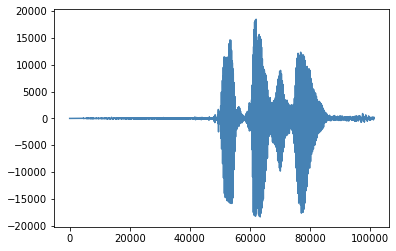

<Figure size 432x288 with 0 Axes>

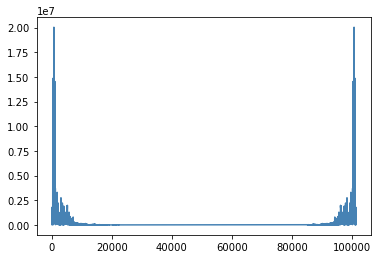

<Figure size 432x288 with 0 Axes>

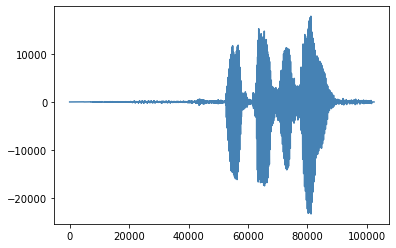

<Figure size 432x288 with 0 Axes>

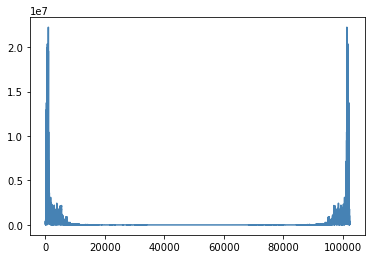

<Figure size 432x288 with 0 Axes>

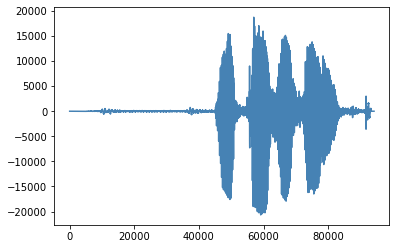

<Figure size 432x288 with 0 Axes>

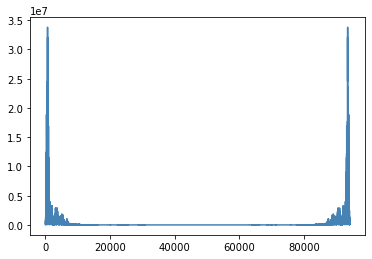

<Figure size 432x288 with 0 Axes>

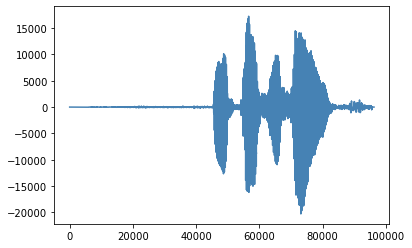

<Figure size 432x288 with 0 Axes>

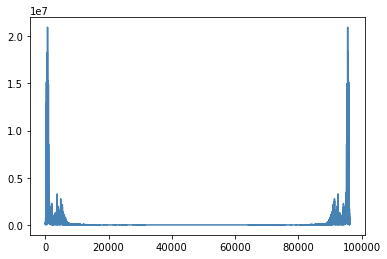

<Figure size 432x288 with 0 Axes>

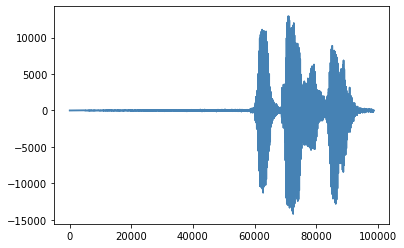

<Figure size 432x288 with 0 Axes>

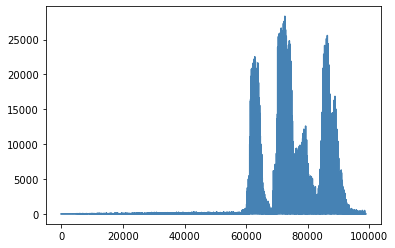

<Figure size 432x288 with 0 Axes>

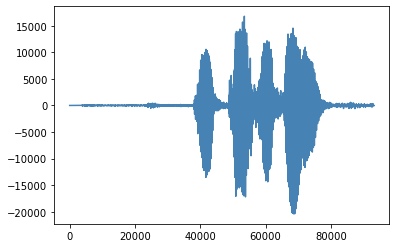

<Figure size 432x288 with 0 Axes>

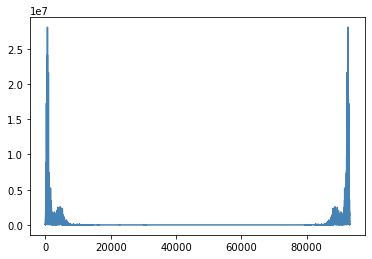

<Figure size 432x288 with 0 Axes>

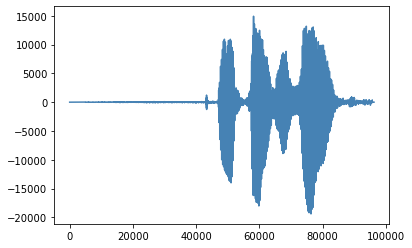

<Figure size 432x288 with 0 Axes>

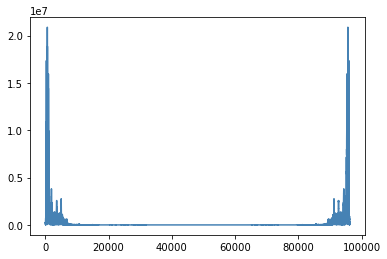

<Figure size 432x288 with 0 Axes>

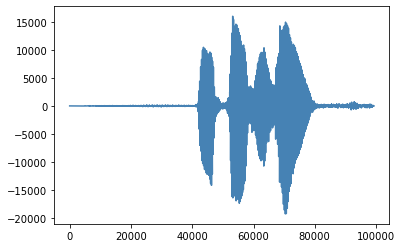

<Figure size 432x288 with 0 Axes>

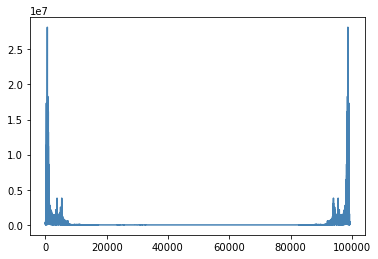

<Figure size 432x288 with 0 Axes>

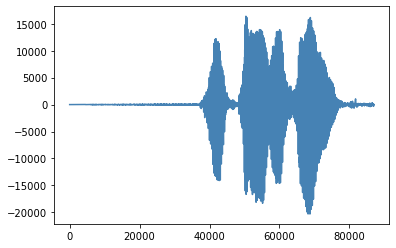

<Figure size 432x288 with 0 Axes>

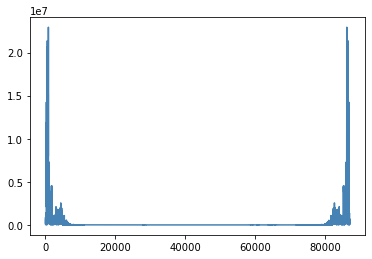

<Figure size 432x288 with 0 Axes>

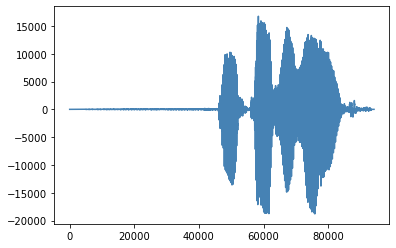

<Figure size 432x288 with 0 Axes>

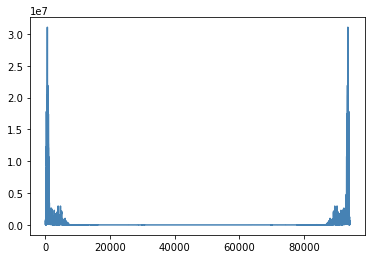

<Figure size 432x288 with 0 Axes>

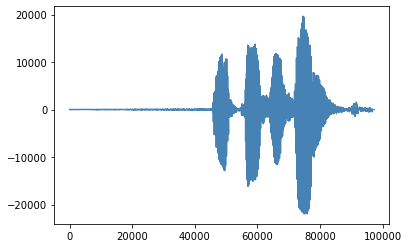

<Figure size 432x288 with 0 Axes>

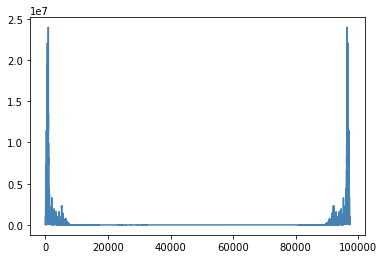

<Figure size 432x288 with 0 Axes>

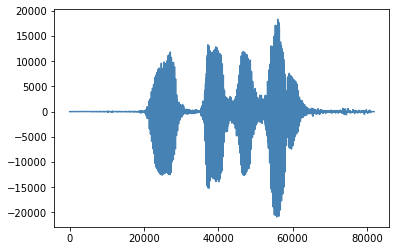

<Figure size 432x288 with 0 Axes>

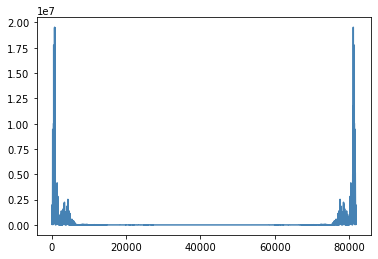

<Figure size 432x288 with 0 Axes>

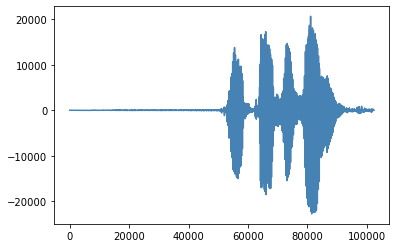

<Figure size 432x288 with 0 Axes>

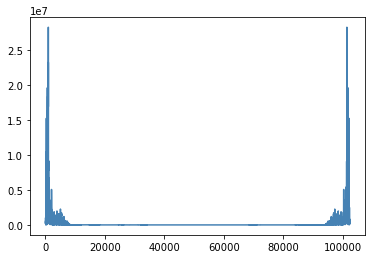

<Figure size 432x288 with 0 Axes>

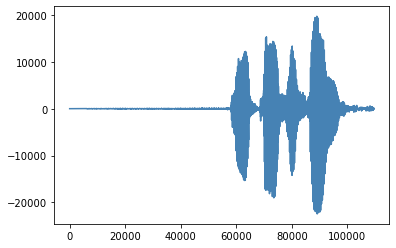

<Figure size 432x288 with 0 Axes>

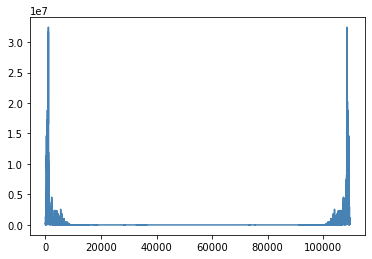

<Figure size 432x288 with 0 Axes>

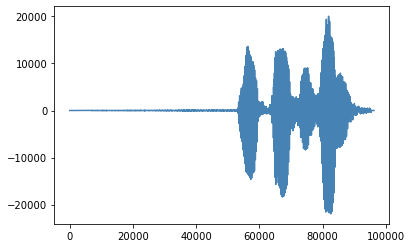

<Figure size 432x288 with 0 Axes>

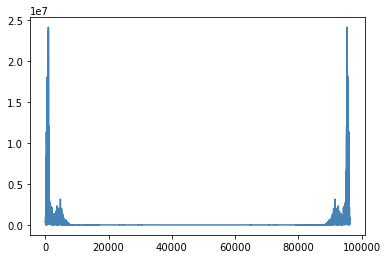

<Figure size 432x288 with 0 Axes>

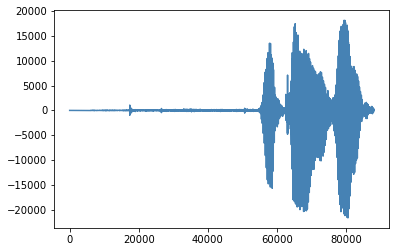

<Figure size 432x288 with 0 Axes>

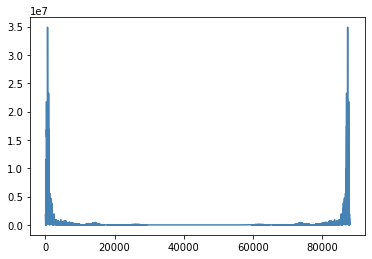

<Figure size 432x288 with 0 Axes>

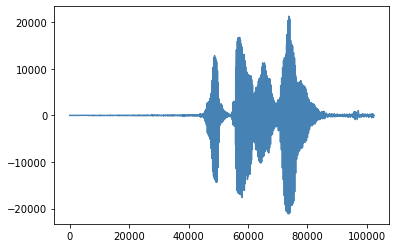

<Figure size 432x288 with 0 Axes>

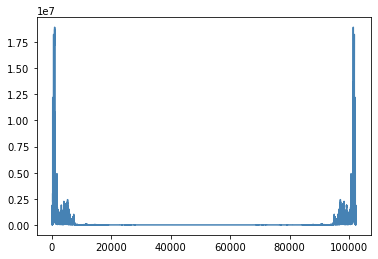

<Figure size 432x288 with 0 Axes>

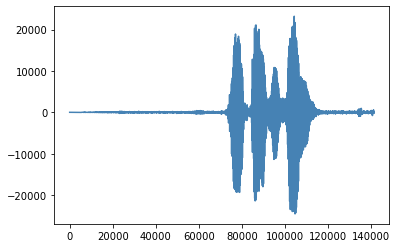

<Figure size 432x288 with 0 Axes>

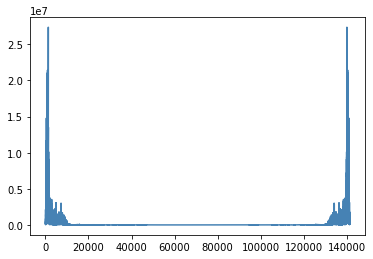

<Figure size 432x288 with 0 Axes>

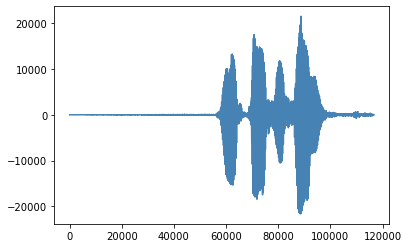

<Figure size 432x288 with 0 Axes>

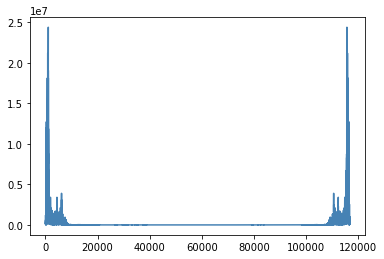

<Figure size 432x288 with 0 Axes>

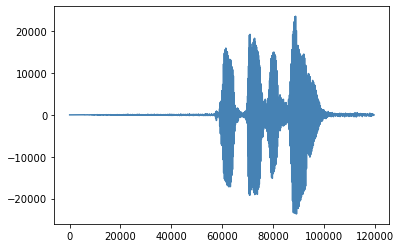

<Figure size 432x288 with 0 Axes>

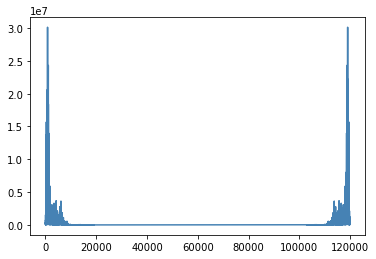

<Figure size 432x288 with 0 Axes>

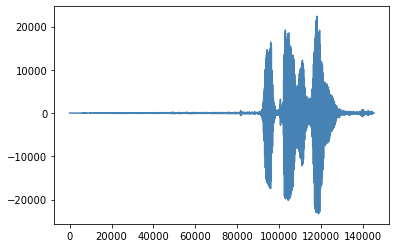

<Figure size 432x288 with 0 Axes>

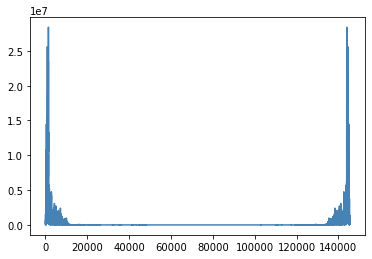

<Figure size 432x288 with 0 Axes>

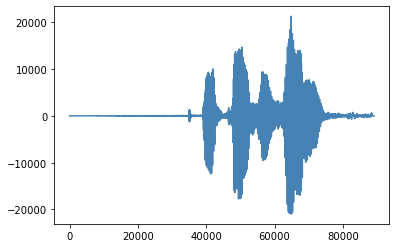

<Figure size 432x288 with 0 Axes>

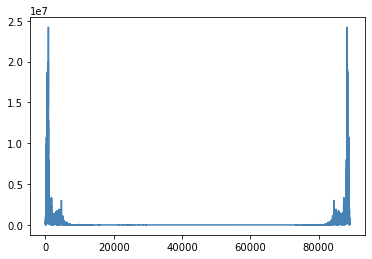

<Figure size 432x288 with 0 Axes>

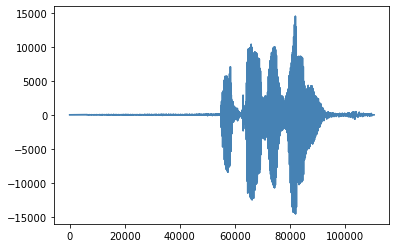

<Figure size 432x288 with 0 Axes>

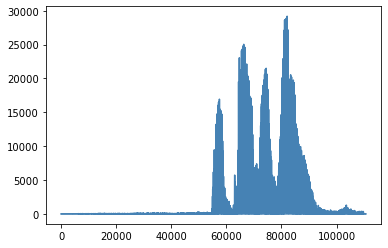

<Figure size 432x288 with 0 Axes>

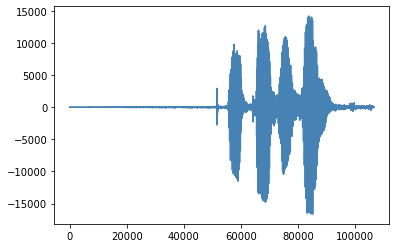

<Figure size 432x288 with 0 Axes>

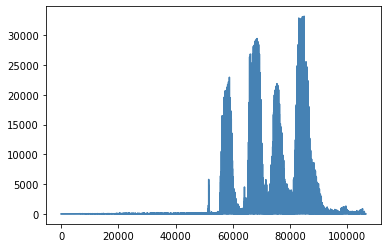

<Figure size 432x288 with 0 Axes>

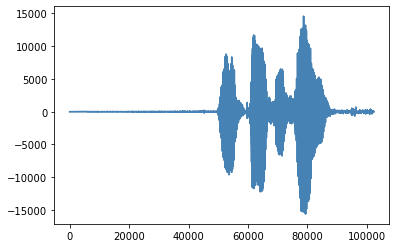

<Figure size 432x288 with 0 Axes>

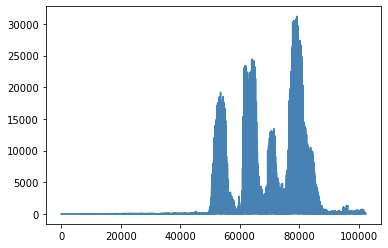

<Figure size 432x288 with 0 Axes>

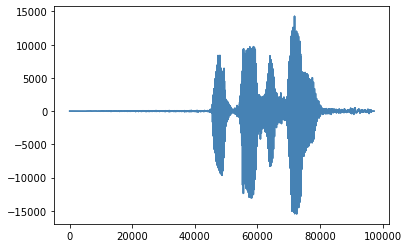

<Figure size 432x288 with 0 Axes>

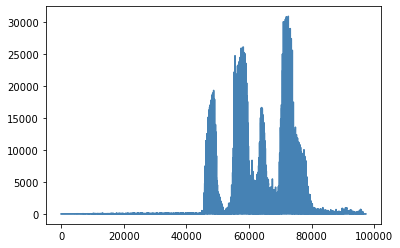

<Figure size 432x288 with 0 Axes>

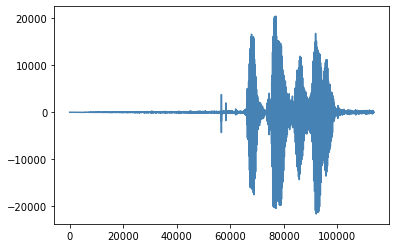

<Figure size 432x288 with 0 Axes>

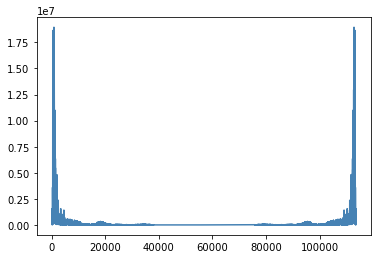

<Figure size 432x288 with 0 Axes>

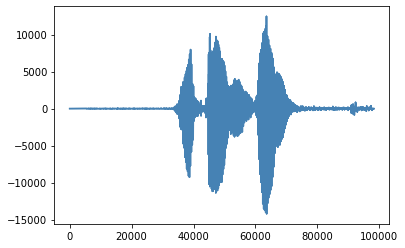

<Figure size 432x288 with 0 Axes>

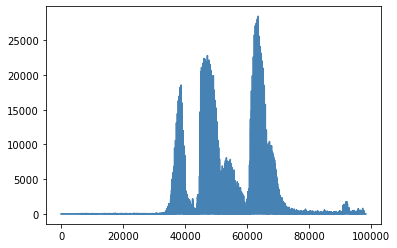

<Figure size 432x288 with 0 Axes>

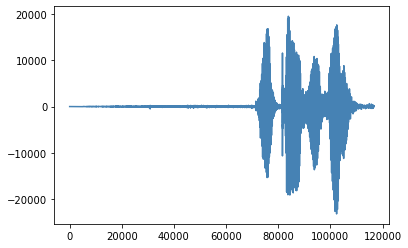

<Figure size 432x288 with 0 Axes>

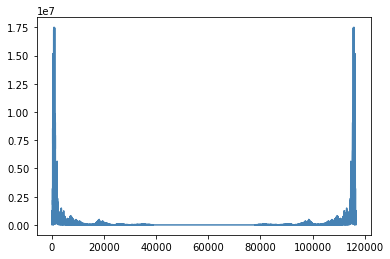

<Figure size 432x288 with 0 Axes>

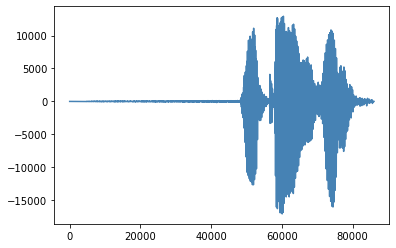

<Figure size 432x288 with 0 Axes>

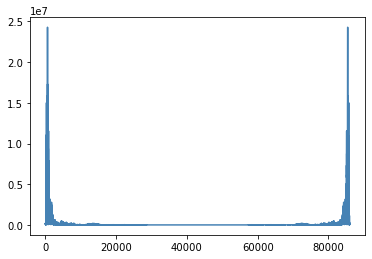

<Figure size 432x288 with 0 Axes>

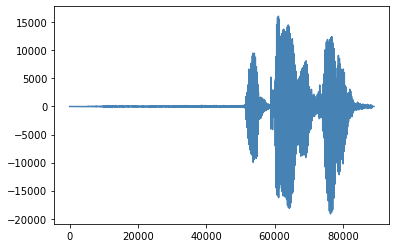

<Figure size 432x288 with 0 Axes>

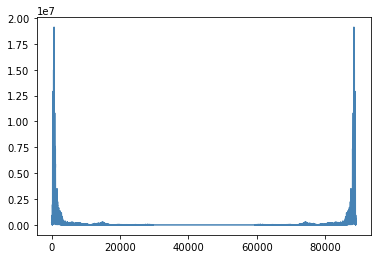

<Figure size 432x288 with 0 Axes>

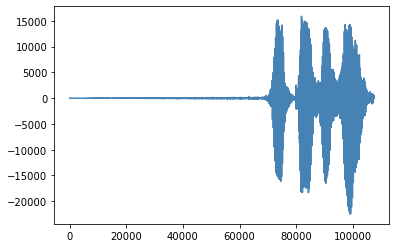

<Figure size 432x288 with 0 Axes>

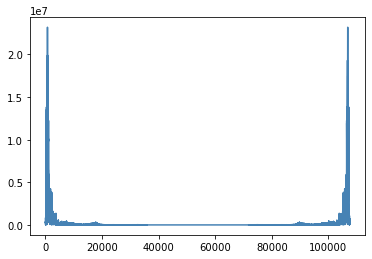

<Figure size 432x288 with 0 Axes>

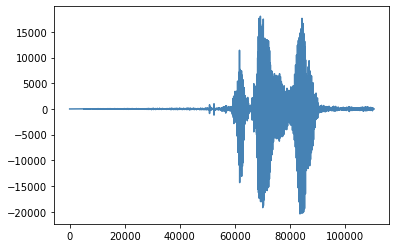

<Figure size 432x288 with 0 Axes>

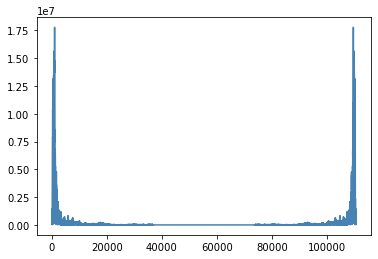

<Figure size 432x288 with 0 Axes>

In [ ]:
#FFT for Imposter's voice samples
def plot(data):
    plt.plot(data, color='steelblue')
    plt.figure()
    plt.show()
for audio in audio_list2:
    rate, wav_data = wavfile.read(audio)
    plot(wav_data)
    plot(np.abs(np.fft.fft(wav_data)))

In [ ]:
#AJ's sampling rate
AJ1 = "C:/Users/Ajinkya/Downloads/Voice Authentication Project/AJ/AJ (1).wav"
x, sr = librosa.load(AJ1)
ipd.Audio(x, rate=sr)
sr

22050

In [ ]:
#Imposter's sampling rate
Imposter1 = "C:/Users/Ajinkya/Downloads/Voice Authentication Project/Imposter/Imposter (1).wav"
x1, sr1 = librosa.load(Imposter1)
ipd.Audio(x1, rate=sr1)
sr

22050

# Imposter - Feature Extraction

# 1. Zero Crossing Rate
Zero-crossing rate is a measure of number of times in a given time interval/frame that the amplitude of the speech signals passes through a value of zero.  It is also extensively used in a wide range of other audio application domains, such as musical genre classification, highlight detection, speech analysis,  A large number of zero crossings implies that there is no dominant low-frequency oscillation.

<ipython-input-55-088001214b70>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


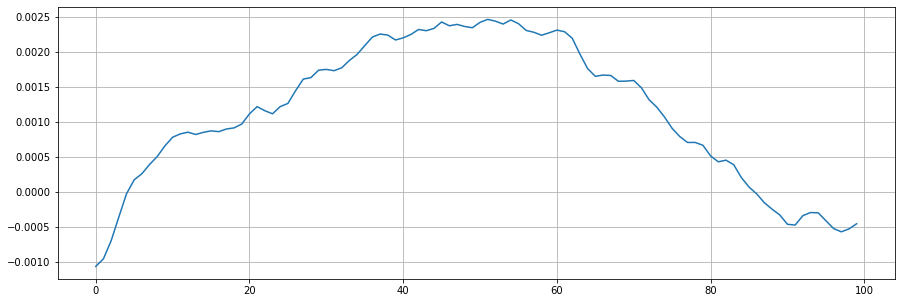

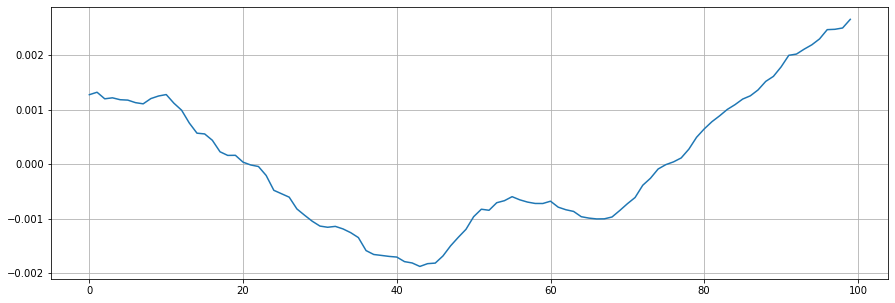

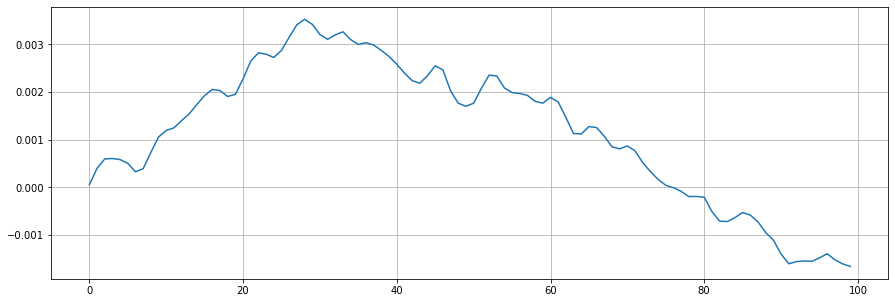

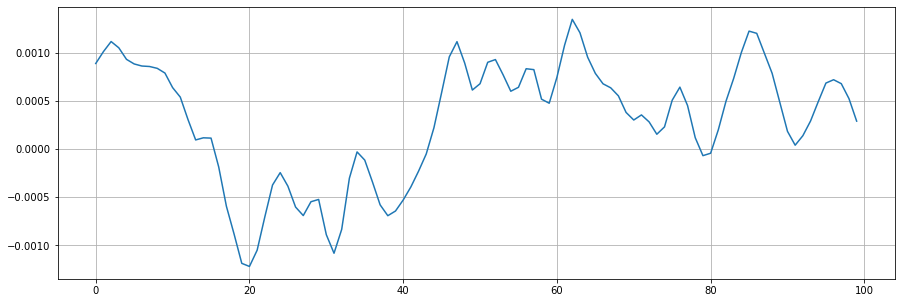

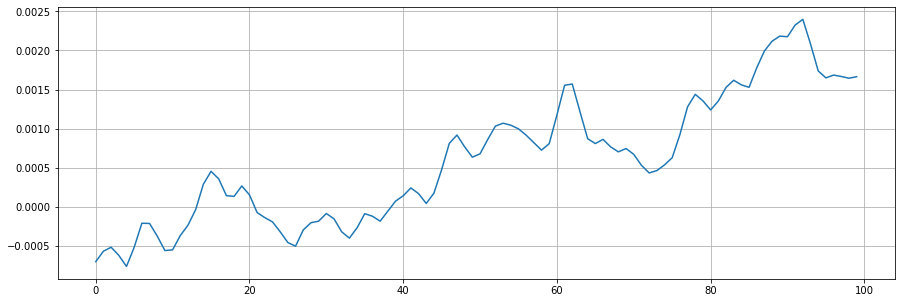

...

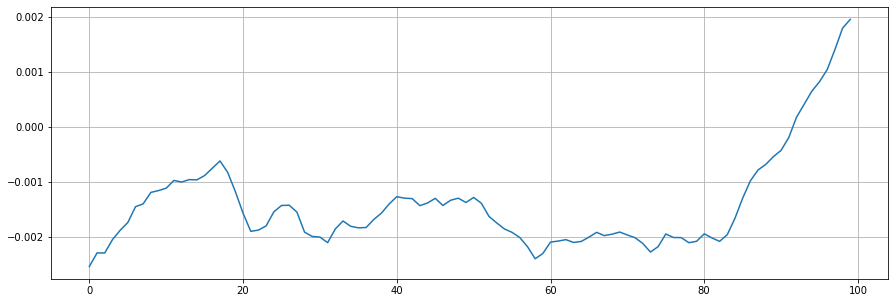

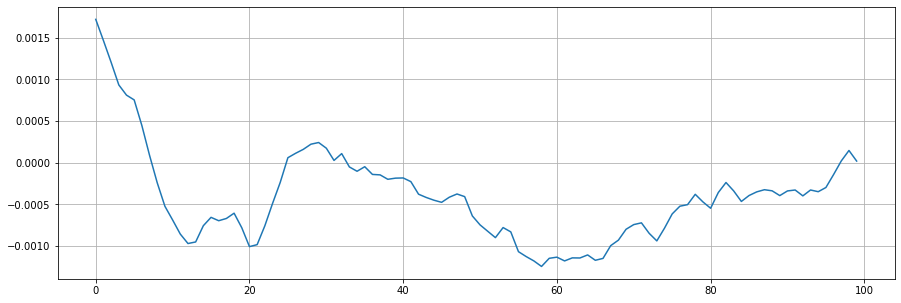

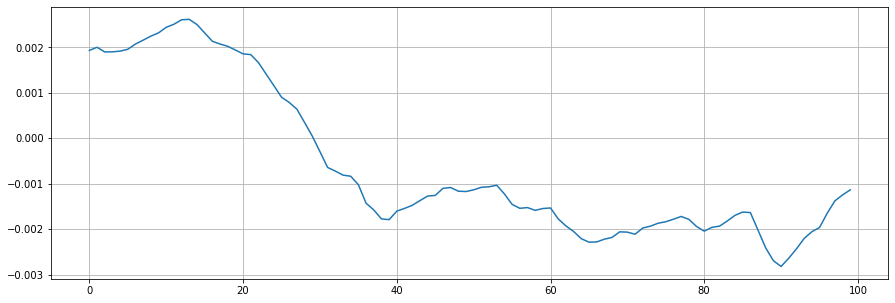

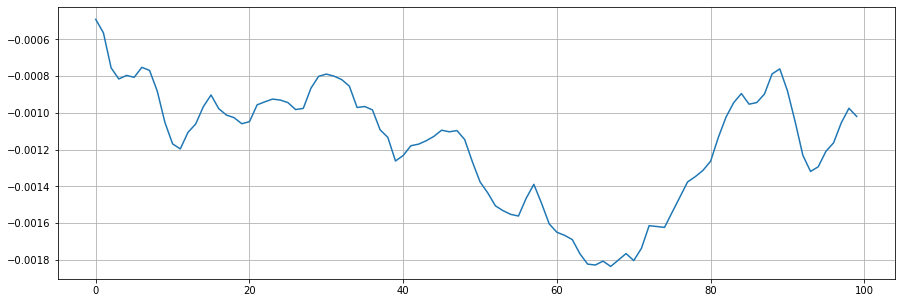

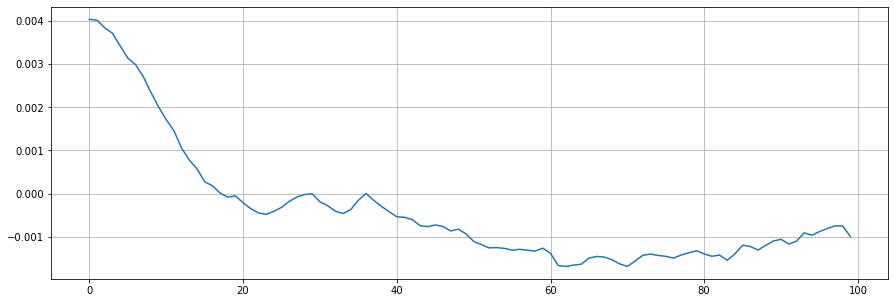

In [ ]:
#Imposter - Zooming in
n0 = 15000
n1 = 15100
ind=40;
for audio in audio_list2:
    plt.figure(figsize=(15,5))
    data,sample_rate=librosa.load(audio)
    featuredf.iloc[ind,1]=np.mean(data)   # save  avg  to  feature matrix 
    featuredf.iloc[ind,2]=np.std(data)  # save  std  to  feature matrix 
     
    zero_crossings = librosa.zero_crossings(data, pad=False)  #  calculater sero crossings
    zero_crossings.shape  
    featuredf.iloc[ind,3]=sum(zero_crossings) # save  # of zcr    to  feature matrix 
    ind=ind+1;
   
    plt.plot(data[n0:n1])
    ipd.Audio(audio)
    plt.grid()

In [ ]:
zero_crossings = librosa.zero_crossings(x1[n0:n1], pad=False)
zero_crossings.shape

(100,)

In [ ]:
print(sum(zero_crossings))

2


# 2.Spectral Centroid
It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. If the frequencies in audio are same throughout then spectral centroid would be around a centre and if there are high frequencies at the end of sound then the centroid would be towards its end.

In [ ]:
spectral_centroids = librosa.feature.spectral_centroid(x1, sr=sr1)[0]
spectral_centroids.shape

(91,)

<ipython-input-59-08751c590489>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


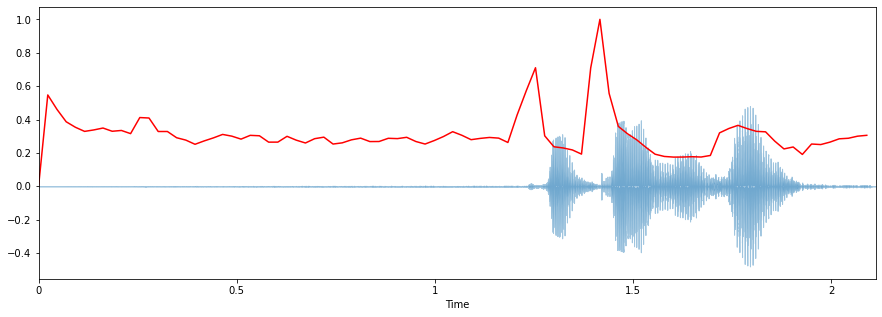

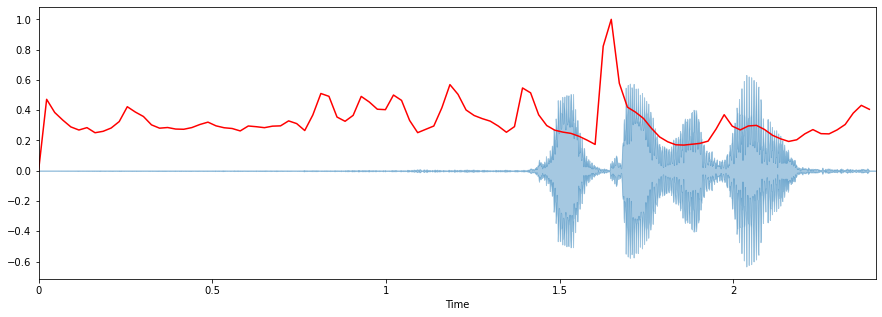

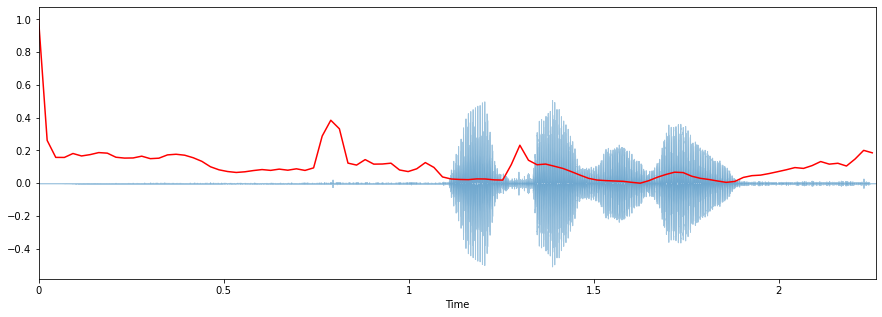

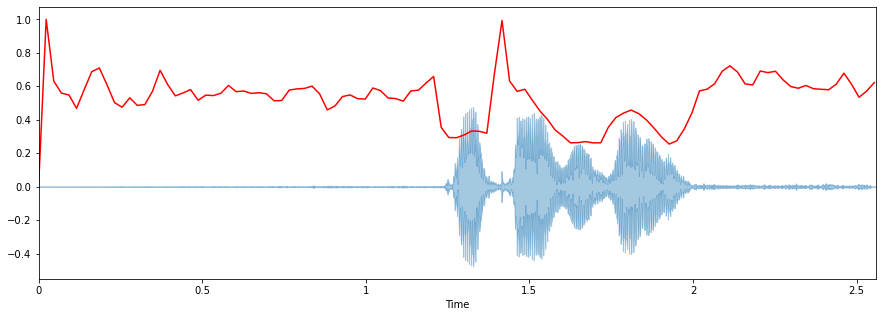

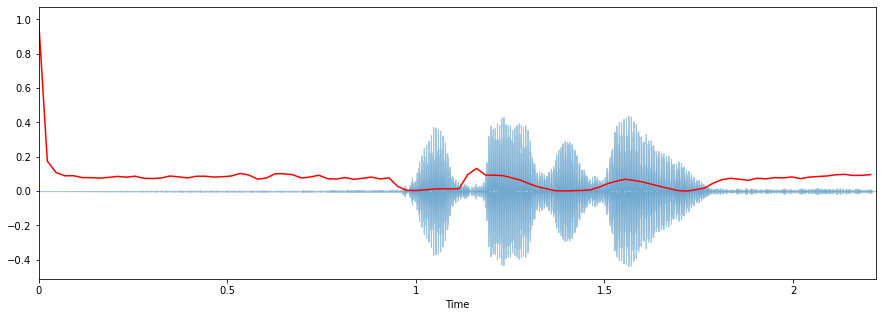

...

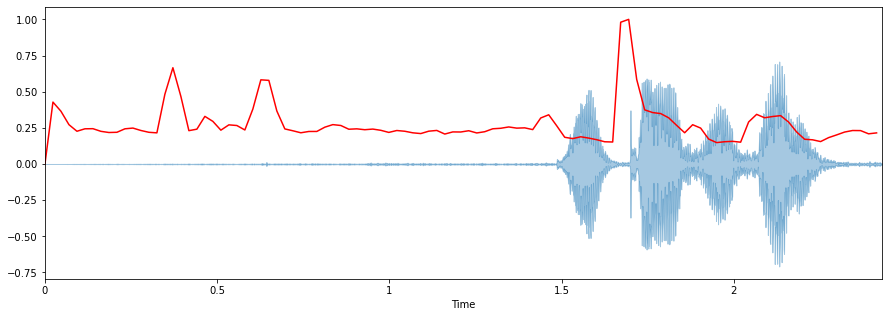

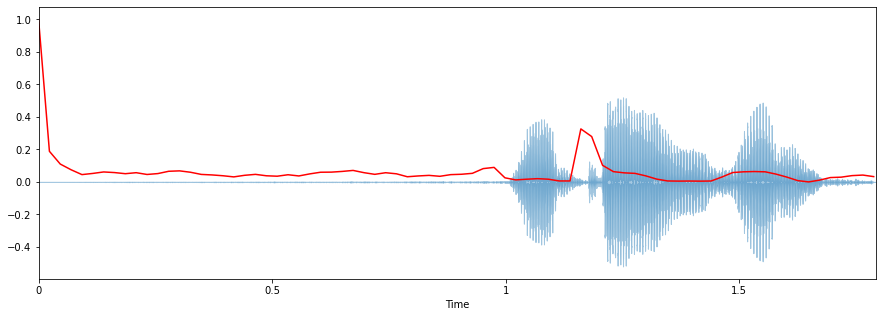

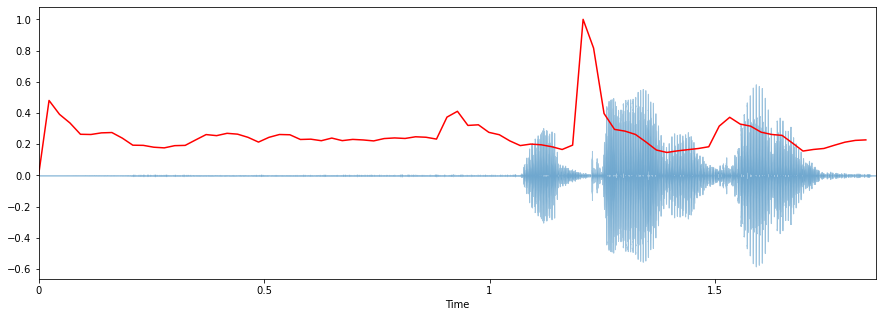

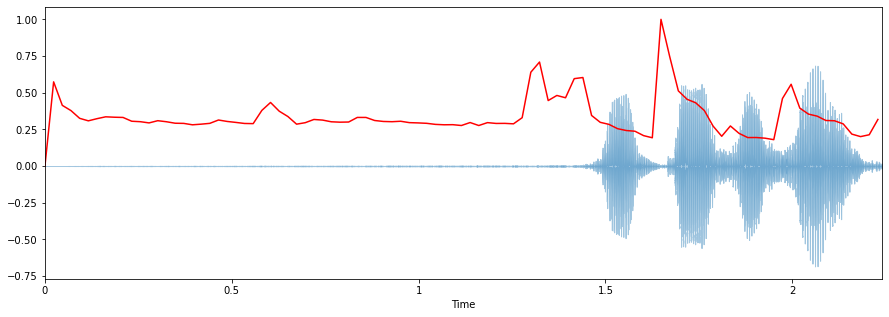

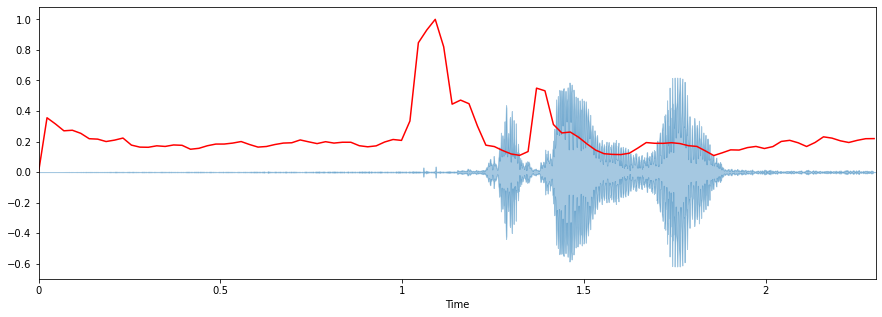

In [ ]:
# Normalising the spectral centroid for visualisation
def normalize(x1, axis=0):
    return sklearn.preprocessing.minmax_scale(x1, axis=axis)
ind=40
for i in audio_list2:
  x1, sr1 = librosa.load(i)
  spectral_centroids = librosa.feature.spectral_centroid(x1, sr=sr1)[0]  # calculater spectral centroid
  # Computing the time variable for visualization
  featuredf.iloc[ind,4]=np.mean(normalize(spectral_centroids))  # save mean to feature matrix
  plt.figure(figsize=(15,5))
  frames = range(len(spectral_centroids))
  t = librosa.frames_to_time(frames)
  ind=ind+1;
  #Plotting the Spectral Centroid along the waveform
  librosa.display.waveplot(x1, sr=sr1, alpha=0.4)
  plt.plot(t, normalize(spectral_centroids), color='r')

# 3.Spectral Rolloff
This is a measure of the amount of the right-skewedness of the power spectrum.The spectral roll off point is the fraction of bins in the power spectrum at which 85% of the power is at lower frequencies. That is, the roll-off is the frequency below which 85% of accumulated spectral magnitude is concentrated. Like the centroid, it takes on higher values for right-skewed spectra.

<ipython-input-60-e2a8489dd78a>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


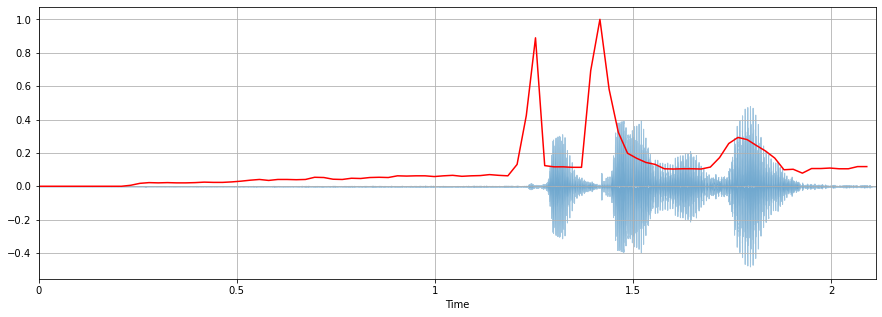

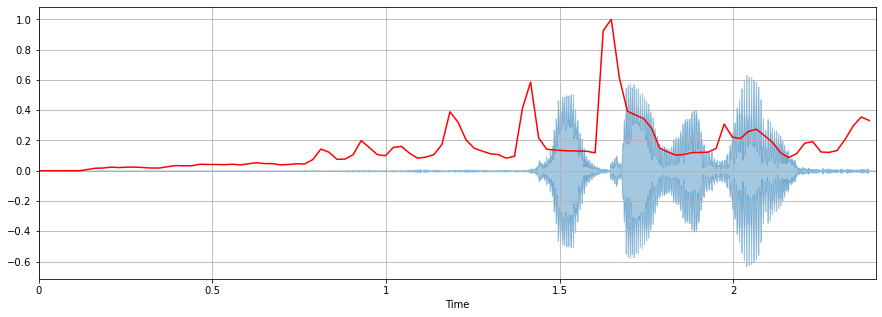

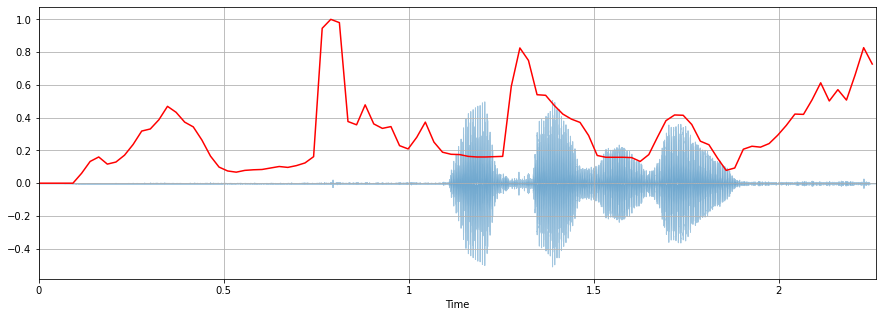

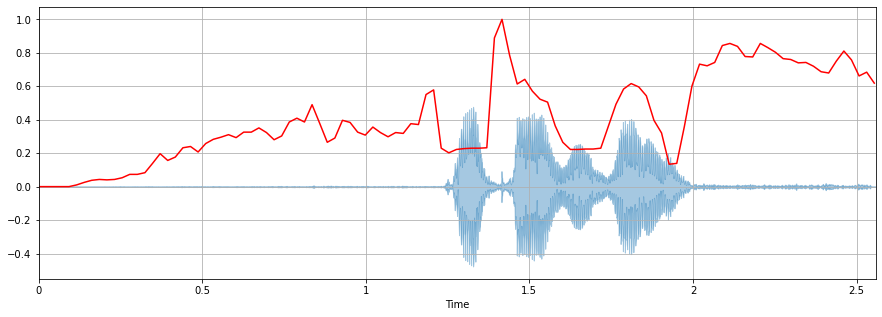

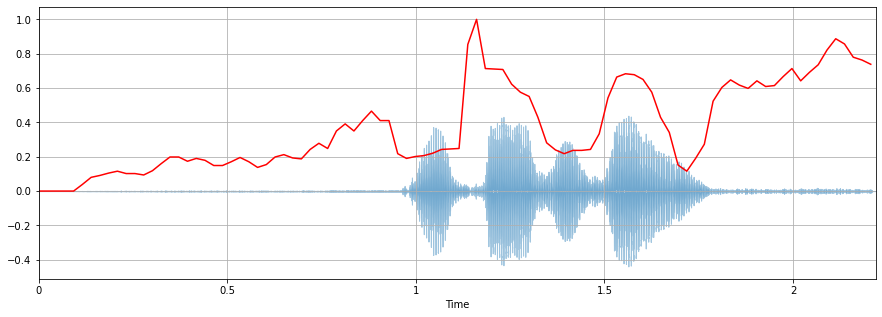

...

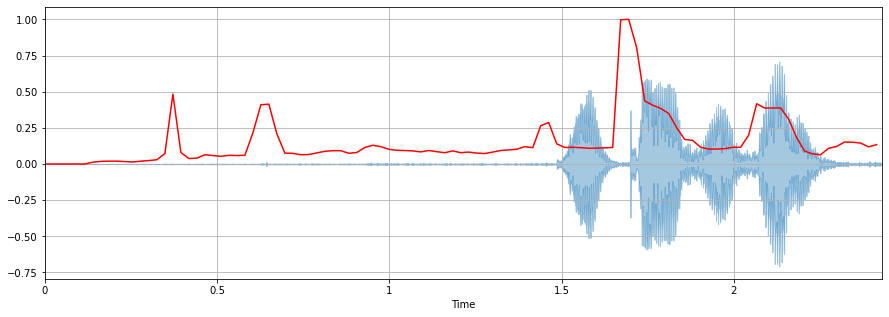

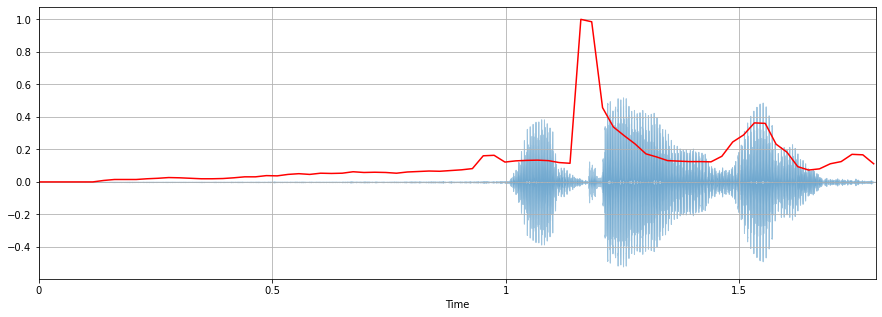

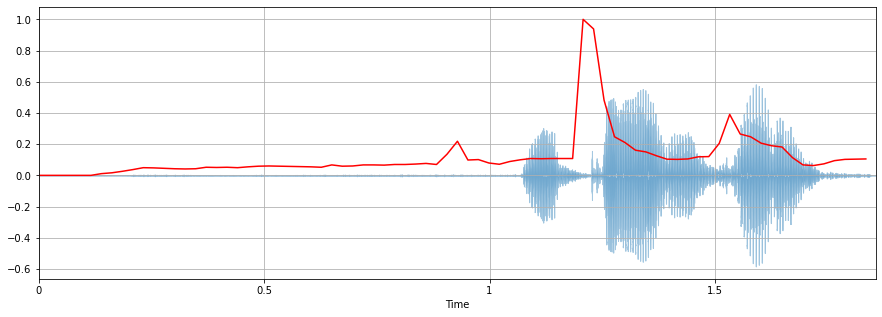

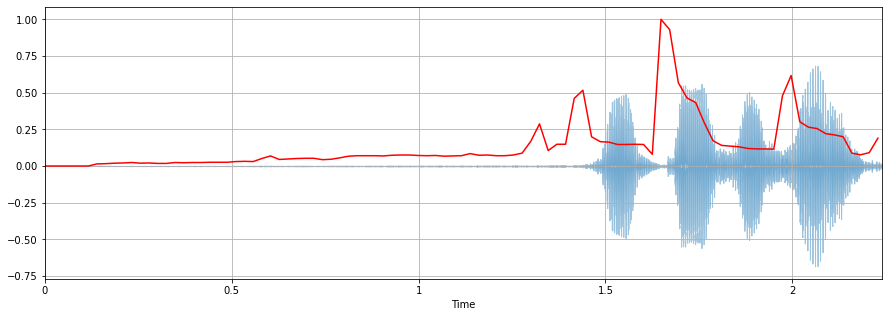

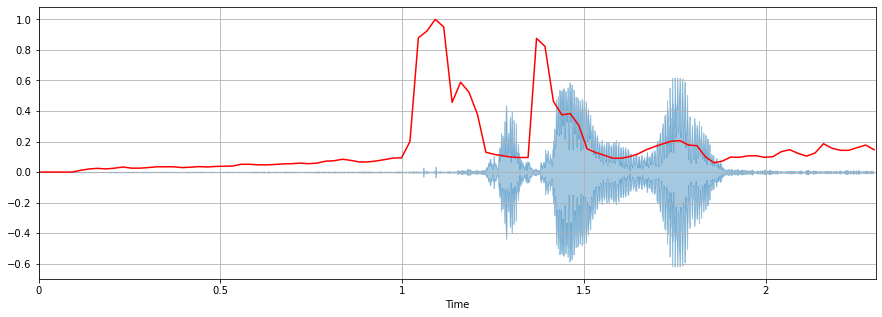

In [ ]:
ind = 40;
for i in audio_list2:
  
  x1, sr1 = librosa.load(i)
  plt.figure(figsize=(15,5))
  spectral_rolloff = librosa.feature.spectral_rolloff(x1+0.01, sr=sr1)[0]  # calculate spectral rollof  for each signal
  featuredf.iloc[ind,5]=np.mean(normalize(spectral_rolloff))   # save mean of spectral roloff to fature matrics
  librosa.display.waveplot(x1, sr=sr1, alpha=0.4)
  frames = range(len(spectral_rolloff))
  t = librosa.frames_to_time(frames)
  plt.plot(t, normalize(spectral_rolloff), color='r')
  plt.grid()
  ind=ind+1;

This feature is one of the most important method to extract a feature of an audio signal and is used majorly whenever working on audio signals. The mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope.

(14, 91)
(14, 104)
(14, 98)
(14, 111)
(14, 96)
(14, 82)
(14, 114)
(14, 91)
(14, 92)
(14, 85)
(14, 87)
(14, 97)
(14, 84)
(14, 87)
(14, 90)
(14, 79)
(14, 85)
(14, 88)
(14, 74)
(14, 92)


<ipython-input-62-8d7154d7f501>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


(14, 99)
(14, 87)
(14, 80)
(14, 92)
(14, 127)
(14, 105)
(14, 108)
(14, 131)
(14, 80)
(14, 100)
(14, 96)
(14, 92)
(14, 88)
(14, 102)
(14, 89)
(14, 105)
(14, 78)
(14, 80)
(14, 97)
(14, 100)


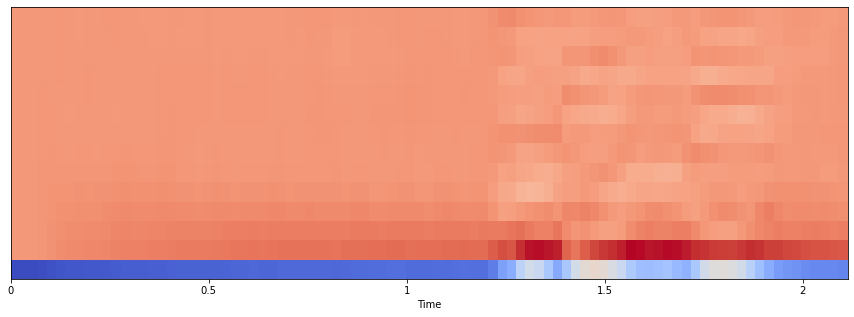

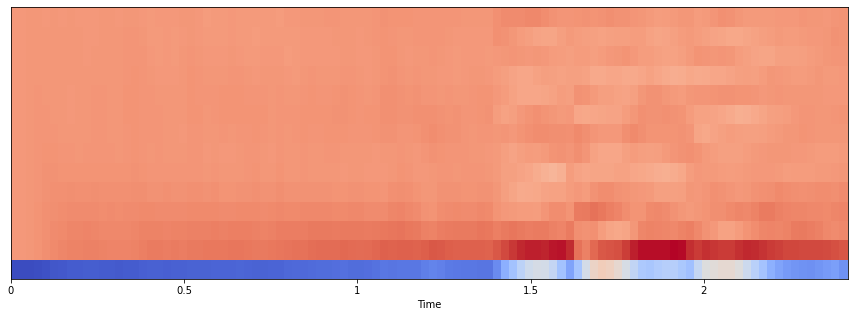

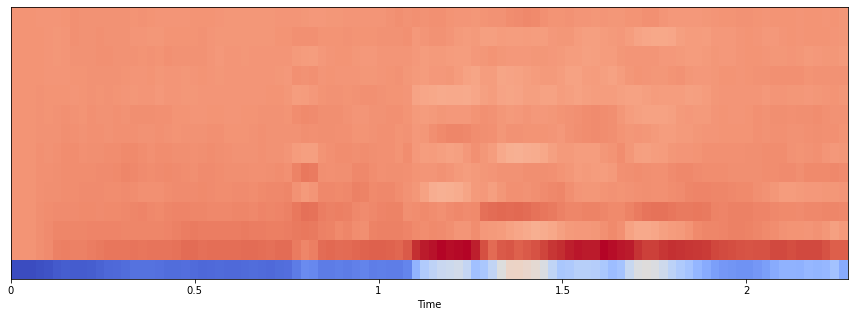

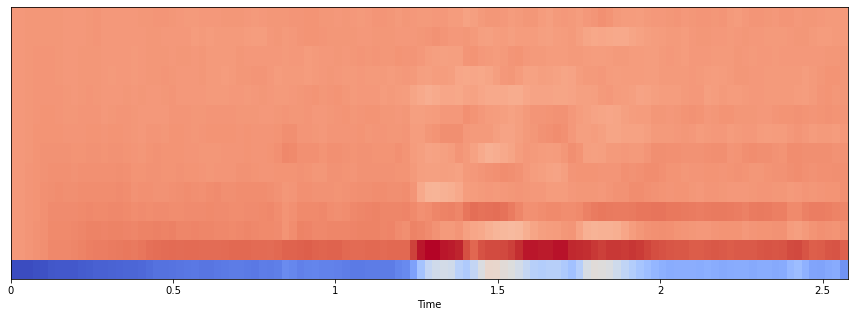

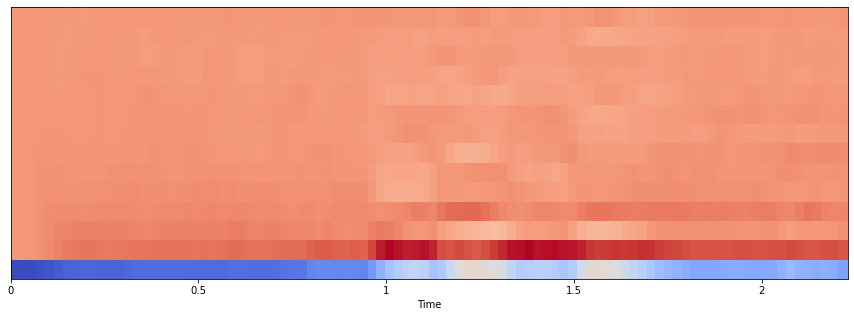

...

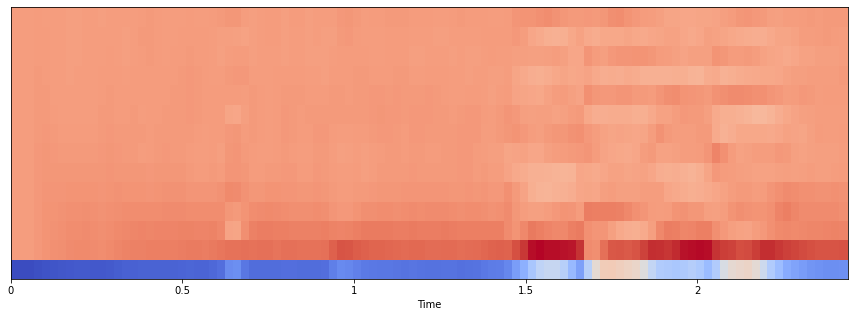

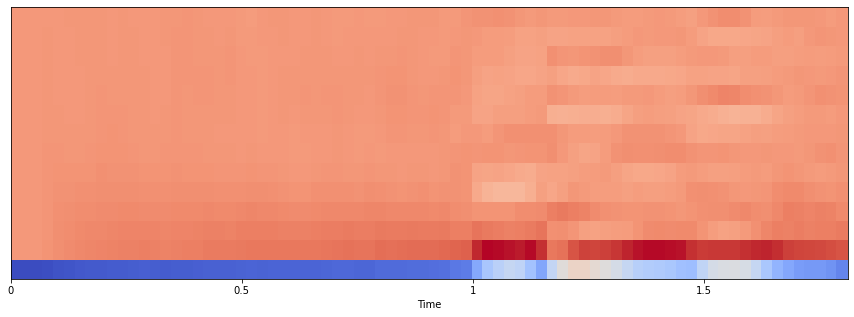

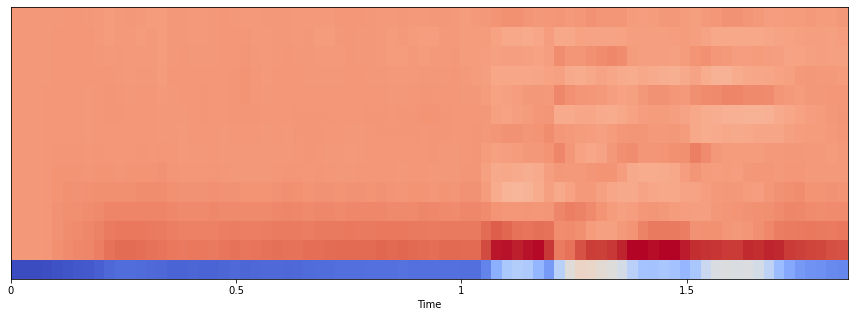

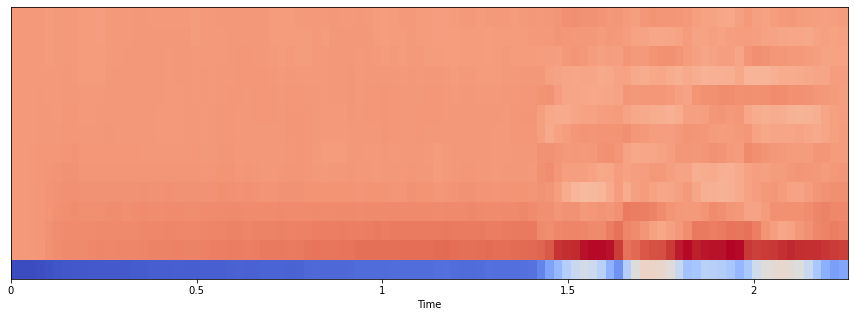

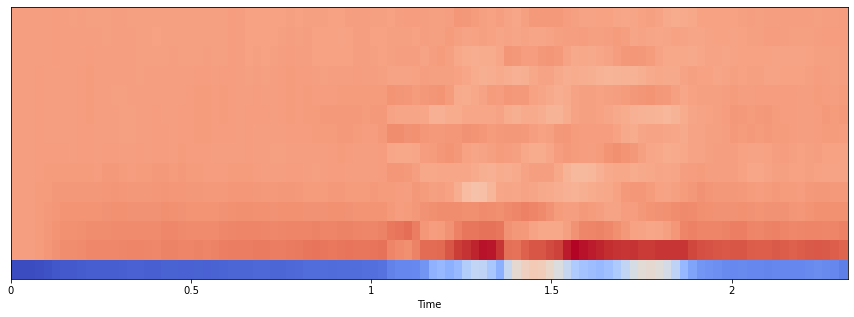

In [ ]:
from librosa.feature.spectral import mfcc
# MFCC
ind=40
for i in audio_list2:
  x1, sr1 = librosa.load(i)
  plt.figure(figsize=(15,5))
  mfccs = librosa.feature.mfcc(x1, sr=sr1,n_mfcc=14)   # find MFCCS  n_mfcc=14 number n_mfcc
  featuredf.iloc[ind,6:20]=np.mean(mfccs,1)    # save  mean of each of 14 MFFC tp feature matrix 
  print(mfccs.shape)
  ind=ind+1;
  librosa.display.specshow(mfccs, sr=sr1, x_axis='time')

# visualize the save feature for imposters

In [ ]:
type(np.mean(spectral_rolloff))
featuredf.head(80)

,User,Average,std,zcr,centroid,rollof,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14
0,AJ,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AJ,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AJ,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AJ,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AJ,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,Imposter,0.000125,0.092597,2102.0,0.273188,0.151187,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
76,Imposter,0.000069,0.084809,1592.0,0.063592,0.124294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
77,Imposter,0.000093,0.089569,1516.0,0.258185,0.118272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
78,Imposter,0.000217,0.095723,1664.0,0.335727,0.136388,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(np.mean(mfccs,1))

[-4.1221597e+02  9.1955528e+01  3.6019966e+01  2.2526691e+01
  1.8501853e+00 -4.8804774e+00 -2.1206118e-01  4.2834511e+00
 -5.6490383e+00  2.4623919e+00 -7.2874937e+00 -3.1728535e+00
 -2.5612869e+00 -1.9574775e+00]


# Now lets calucate the same  avg, std , zeroc crosing ,spectral centroid .spectral rolloff  and MFCCS  features for authentic audion ion

# 1. Zero Crossing Rate

<ipython-input-64-550e64b008da>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


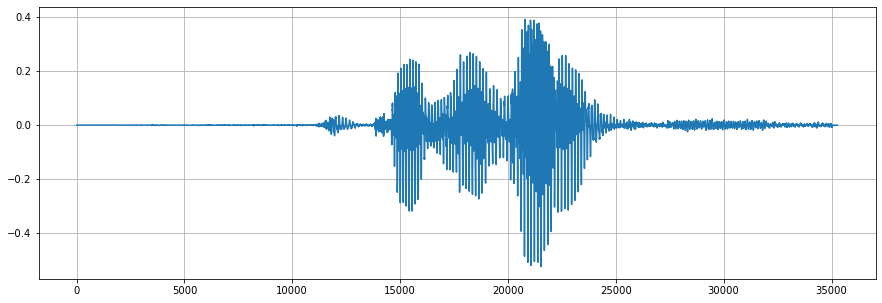

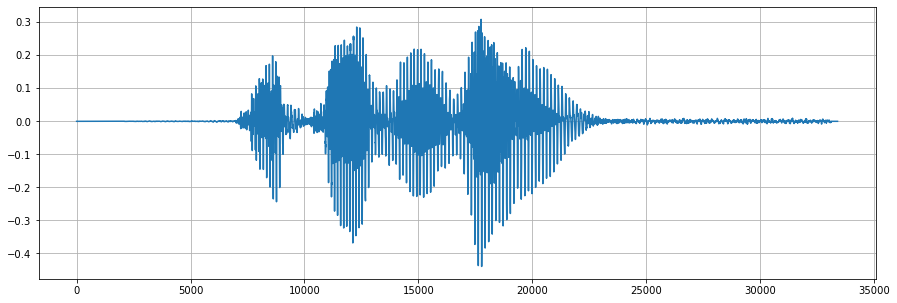

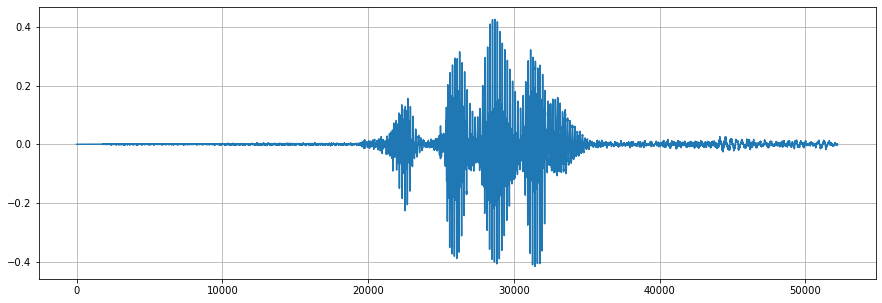

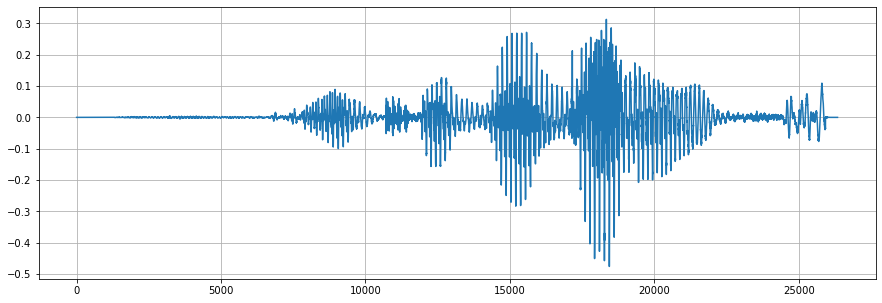

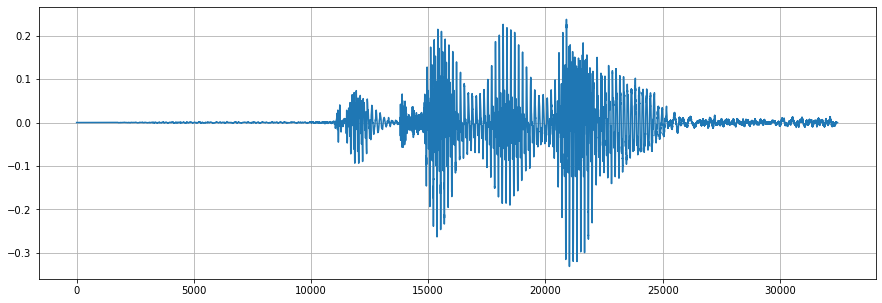

...

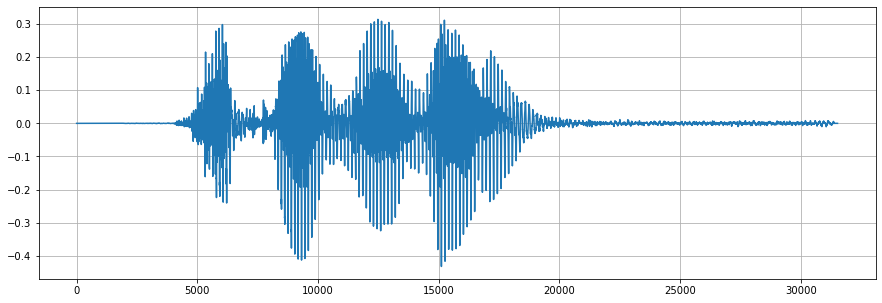

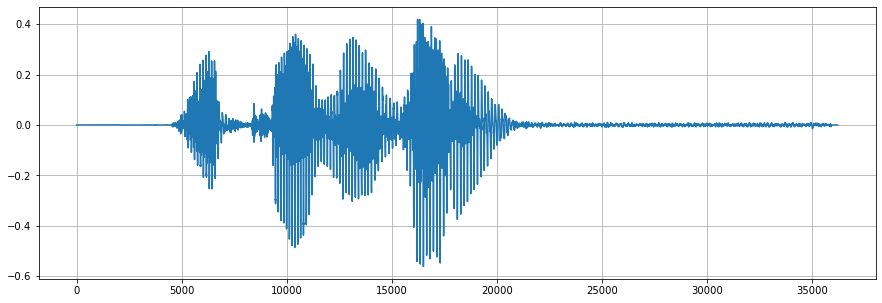

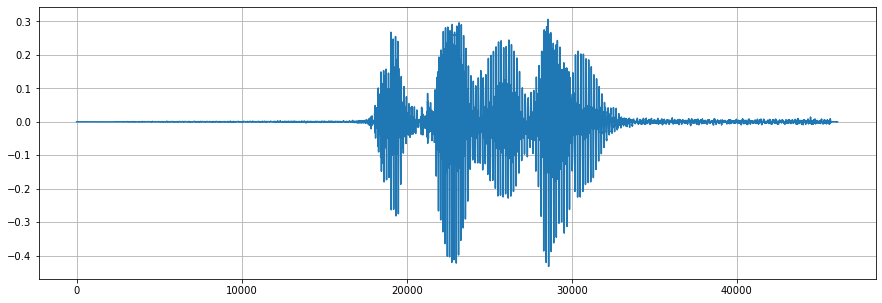

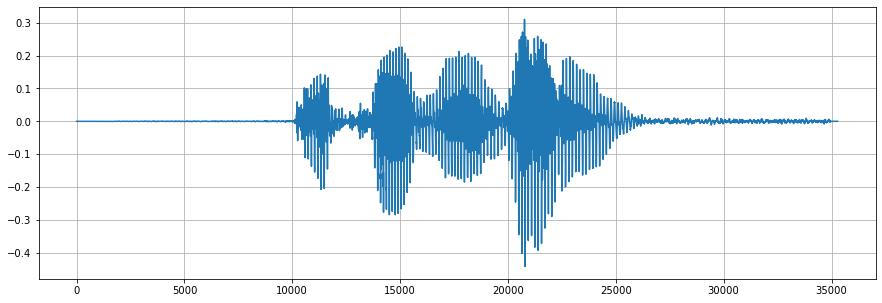

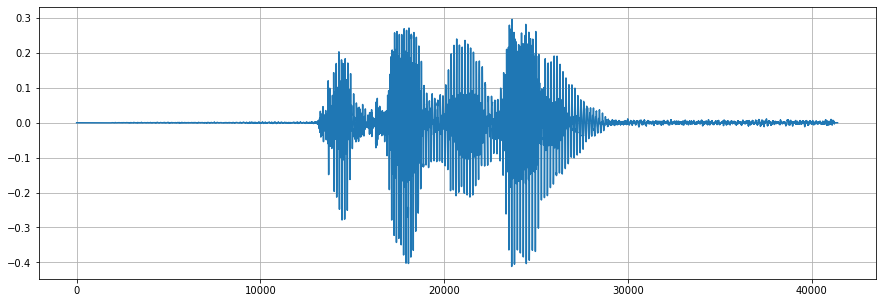

In [ ]:
# AJ - Zooming in
n0 = 15000
n1 = 15100
ind=0;
for audio in audio_list1:
    plt.figure(figsize=(15,5))
    data,sample_rate=librosa.load(audio)
    zero_crossings = librosa.zero_crossings(data, pad=False) 
    plt.plot(data)
    ipd.Audio(audio)
    plt.grid()
    featuredf.iloc[ind,3]=sum(zero_crossings)
    featuredf.iloc[ind,1]=np.mean(data)
    featuredf.iloc[ind,2]=np.std(data)
    ind=ind+1;

# 2.Spectral Centroid

In [ ]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(69,)

<ipython-input-66-b350175cce02>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


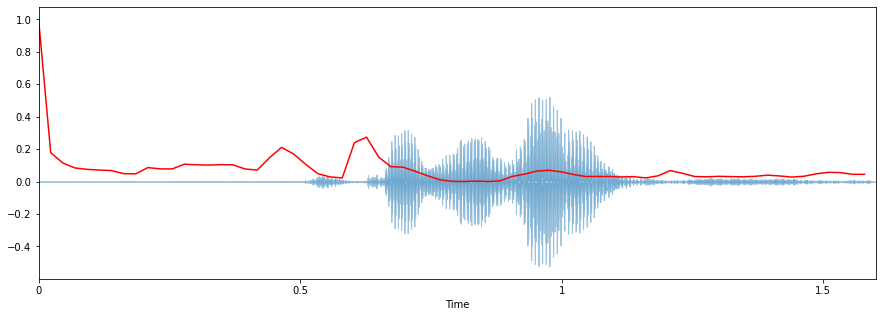

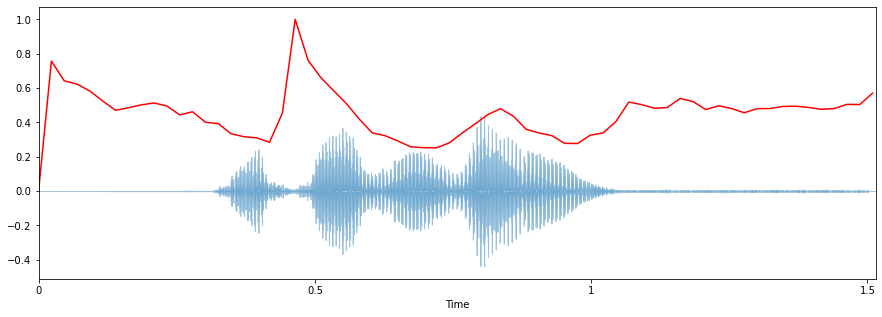

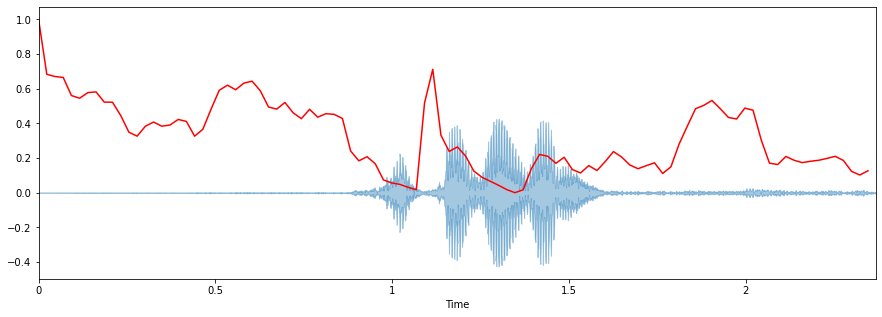

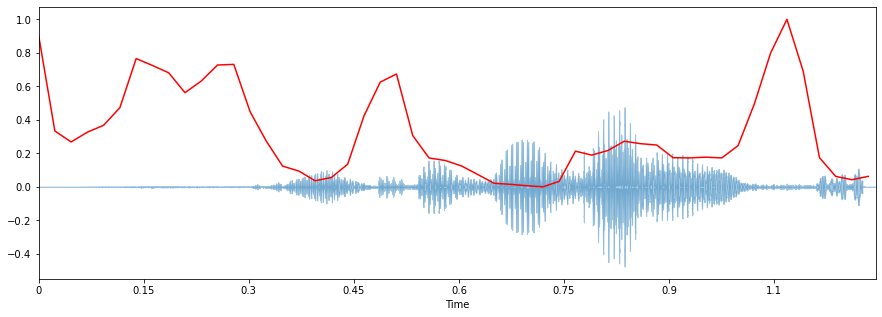

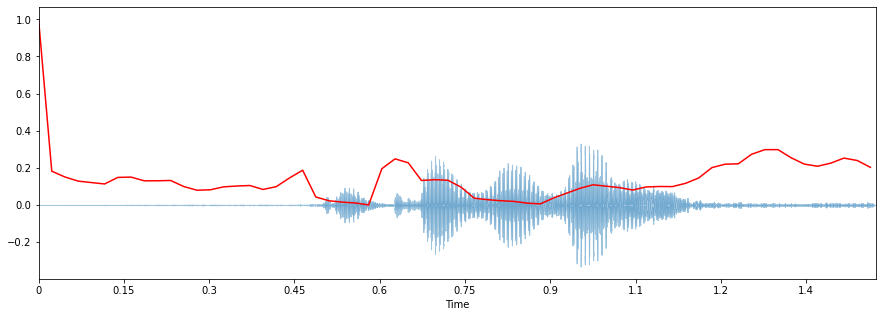

...

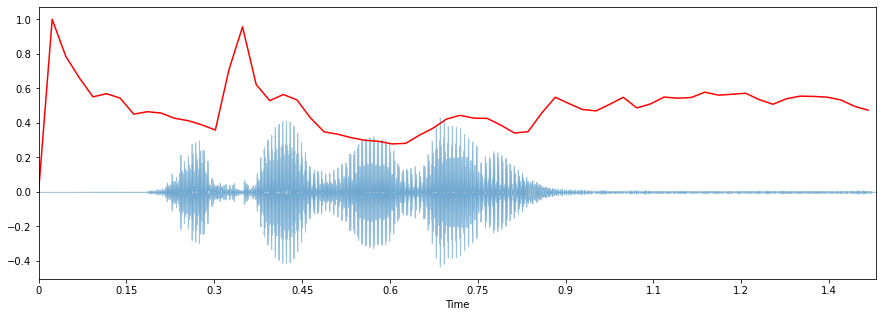

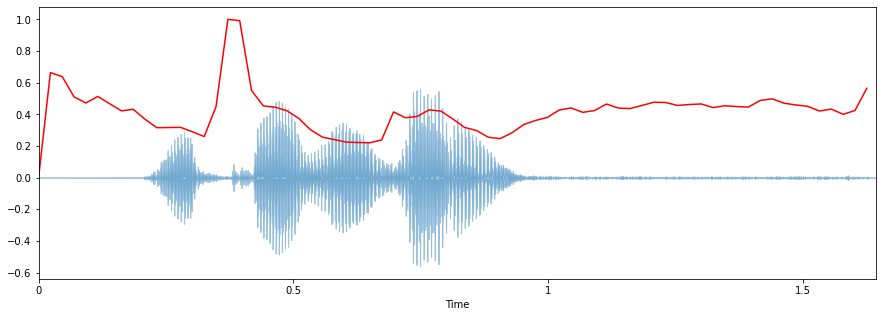

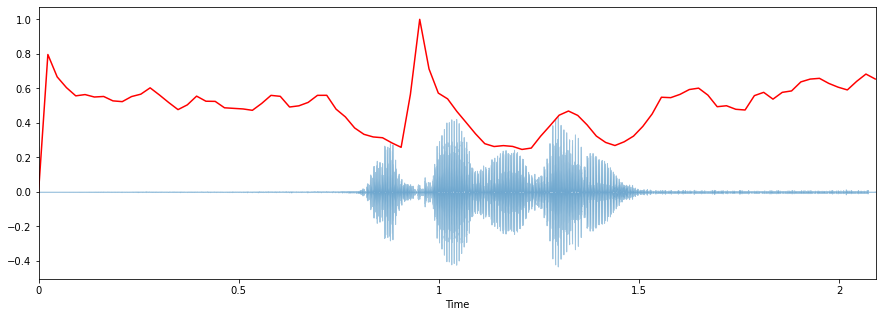

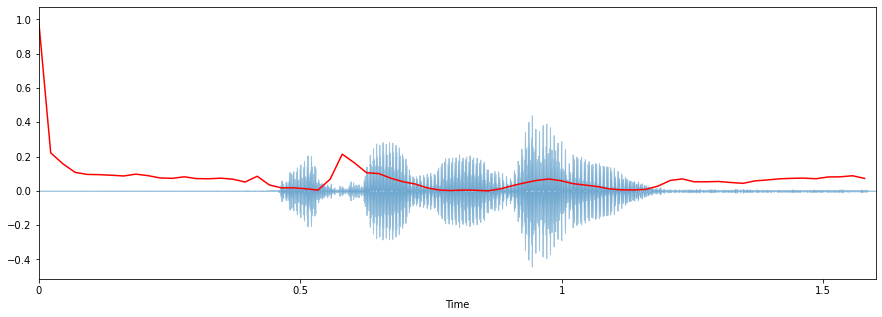

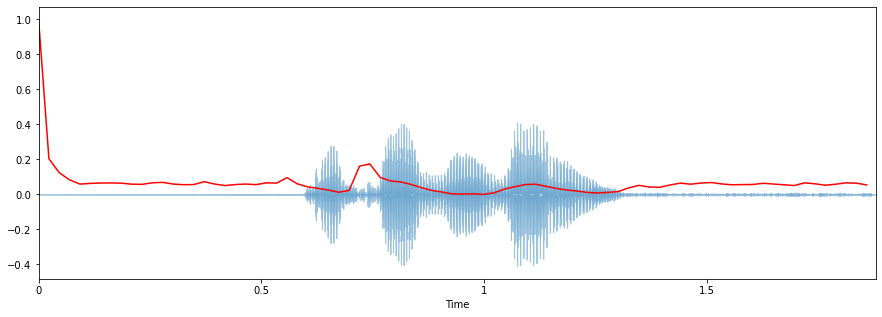

In [ ]:
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
ind=0
for i in audio_list1:
  x, sr = librosa.load(i)
  spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
  featuredf.iloc[ind,4]=np.mean(normalize(spectral_centroids))
  # Computing the time variable for visualization
  plt.figure(figsize=(15,5))
  frames = range(len(spectral_centroids))
  t = librosa.frames_to_time(frames)

  #Plotting the Spectral Centroid along the waveform
  librosa.display.waveplot(x, sr=sr, alpha=0.4)
  plt.plot(t, normalize(spectral_centroids), color='r')
  ind=ind+1

# 3.Spectral Rolloff

<ipython-input-67-d7a2d15ef909>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


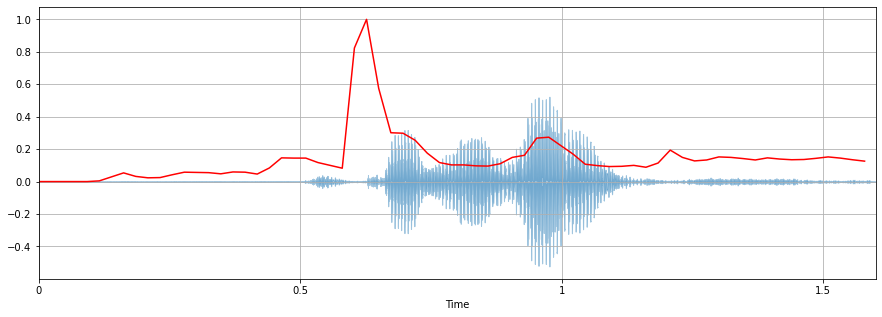

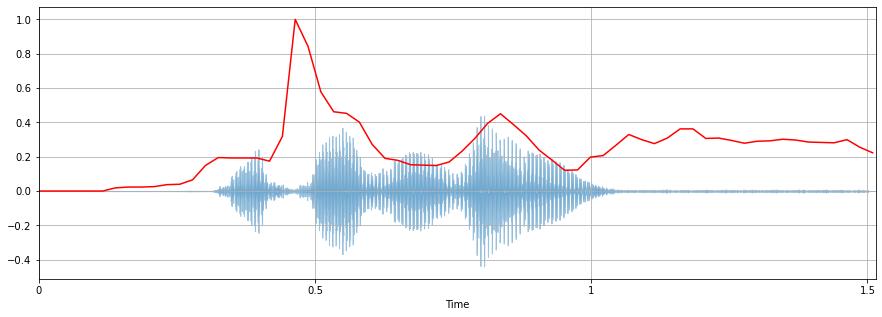

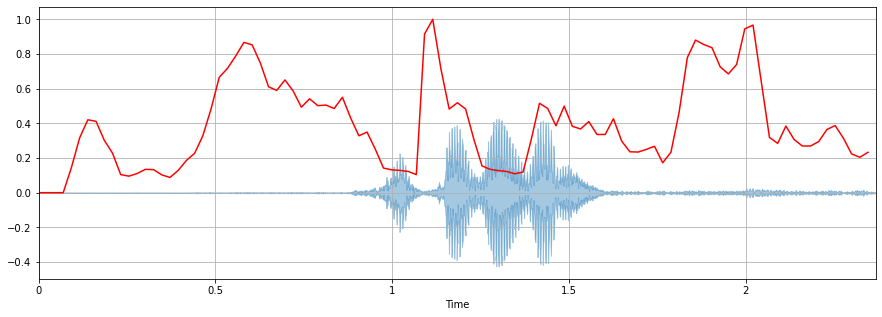

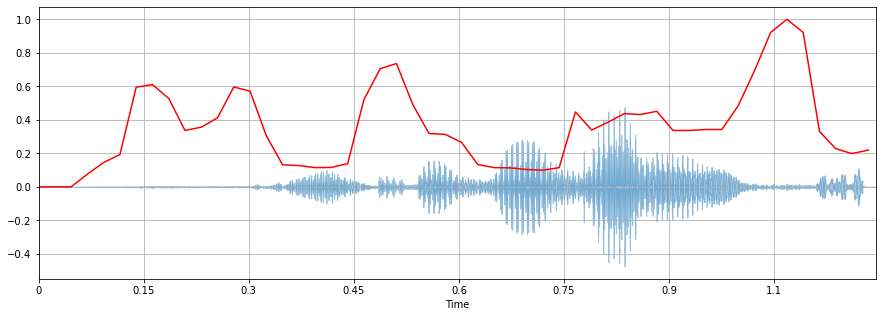

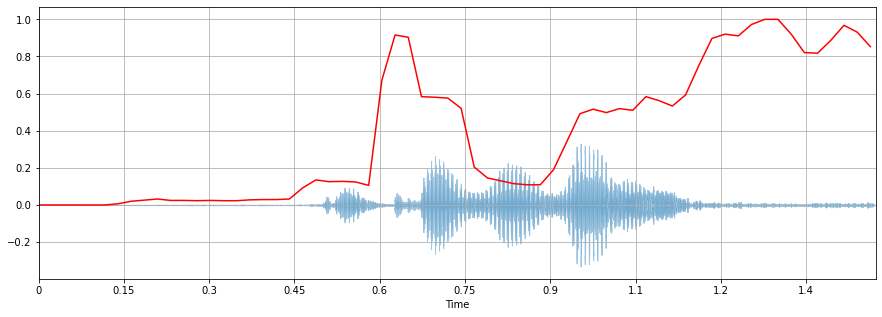

...

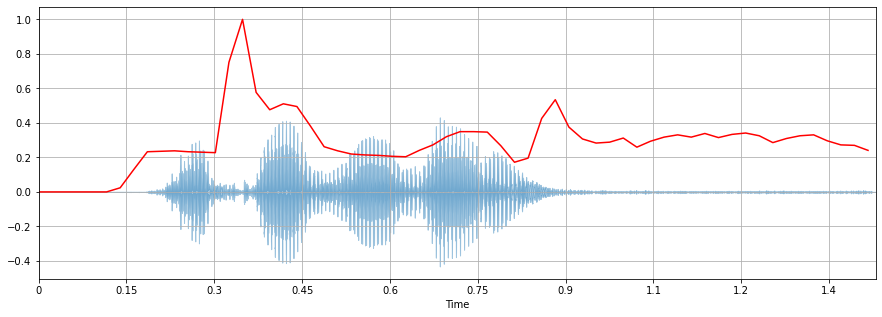

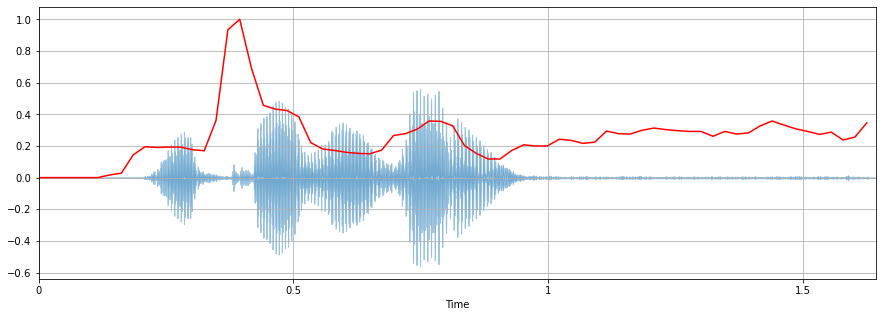

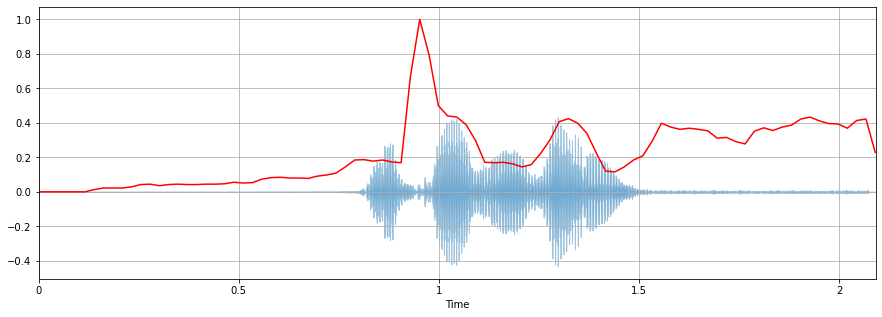

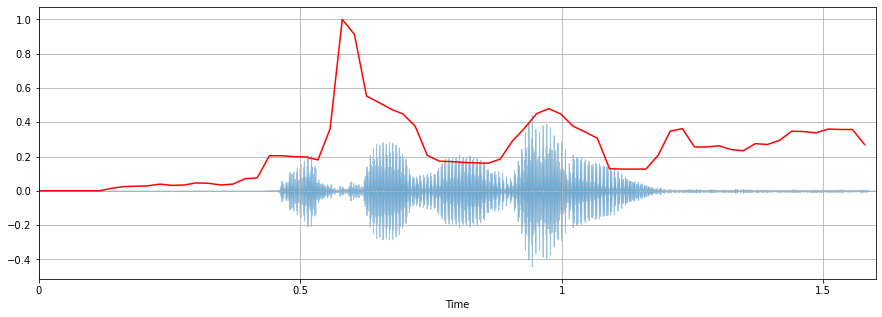

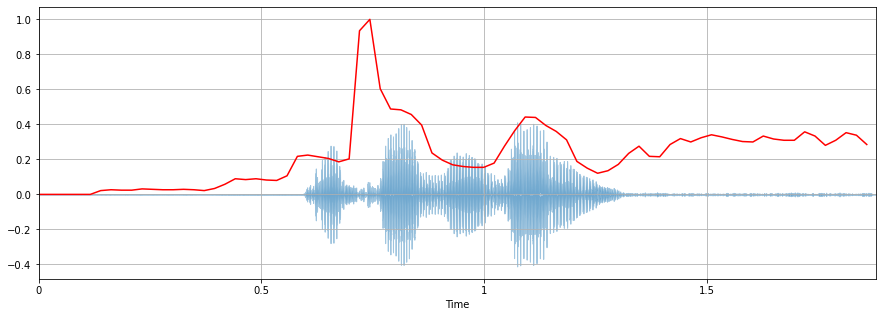

In [ ]:
ind=0;
for i in audio_list1:
  x, sr = librosa.load(i)
  plt.figure(figsize=(15,5))
  spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
  featuredf.iloc[ind,5]=np.mean(spectral_rolloff)
  librosa.display.waveplot(x, sr=sr, alpha=0.4)
  frames = range(len( normalize(spectral_rolloff)))
  t = librosa.frames_to_time(frames)
  plt.plot(t, normalize(spectral_rolloff), color='r')
  plt.grid()
  ind=ind+1

# 4.MFCC

(14, 69)
(14, 66)
(14, 102)
(14, 52)
(14, 64)
(14, 63)
(14, 54)
(14, 89)
(14, 58)
(14, 56)
(14, 61)
(14, 69)
(14, 79)
(14, 91)
(14, 65)
(14, 72)
(14, 82)
(14, 52)
(14, 69)
(14, 72)


<ipython-input-68-fd770ea93bf4>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,5))


(14, 71)
(14, 73)
(14, 67)
(14, 71)
(14, 78)
(14, 68)
(14, 58)
(14, 43)
(14, 48)
(14, 53)
(14, 52)
(14, 72)
(14, 57)
(14, 67)
(14, 46)
(14, 62)
(14, 71)
(14, 91)
(14, 69)
(14, 81)


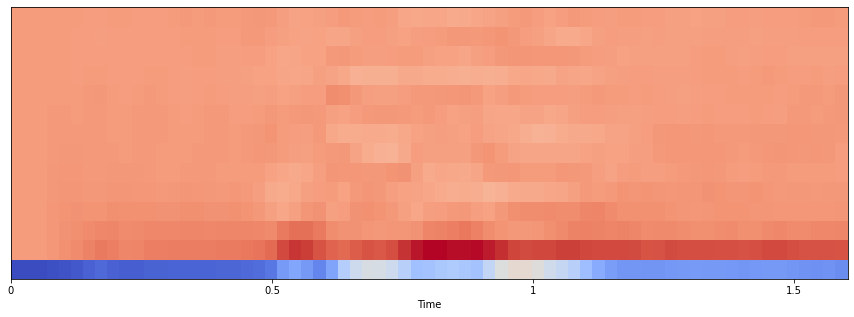

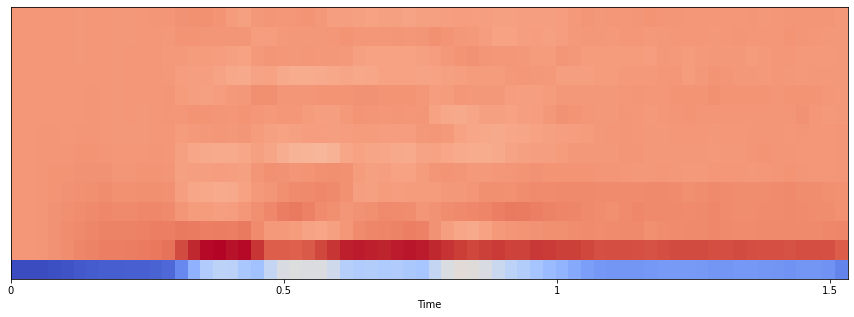

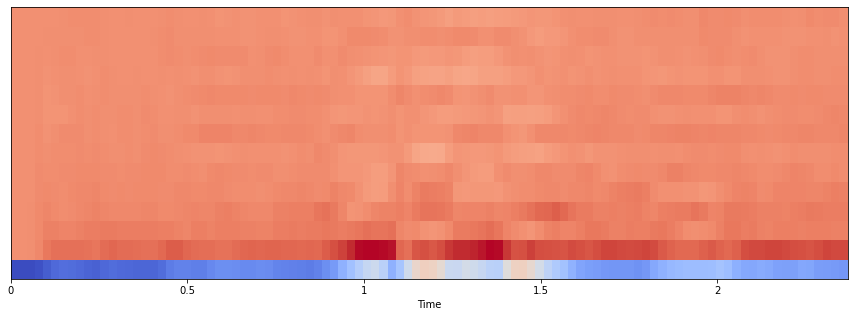

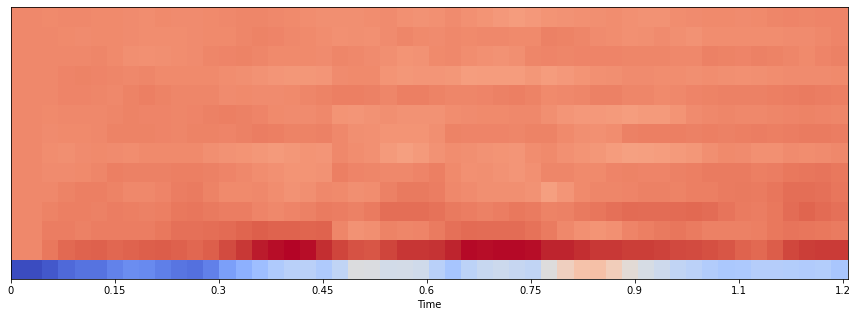

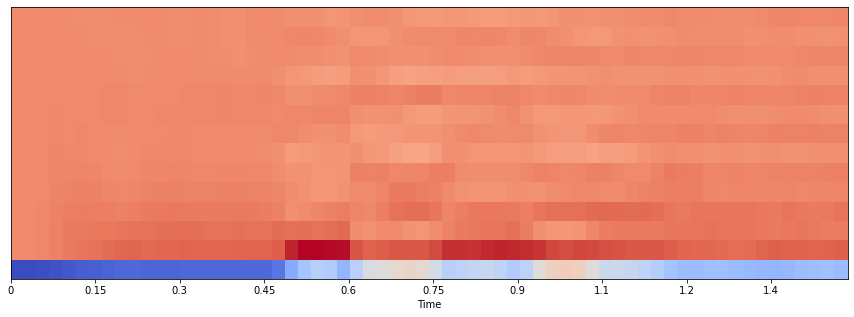

...

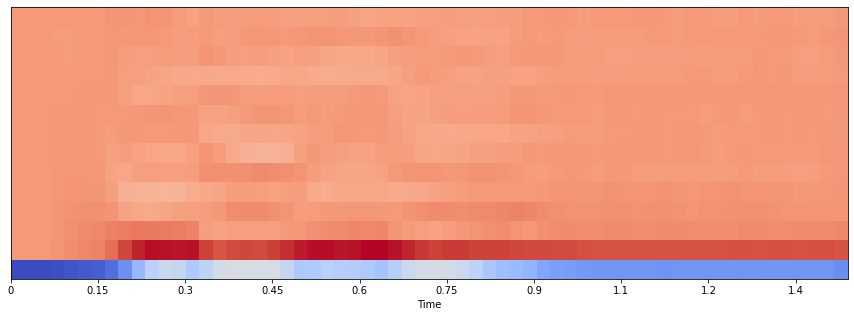

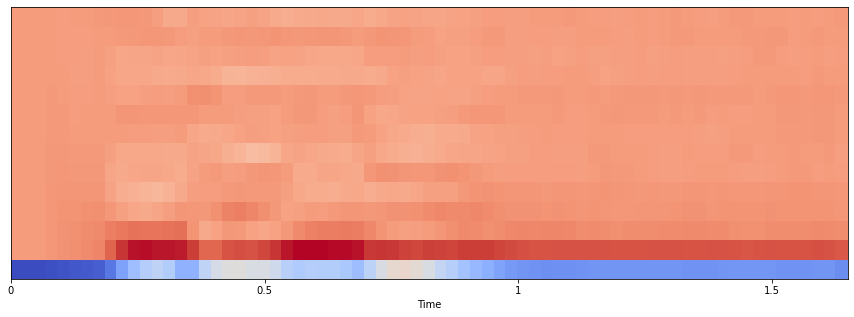

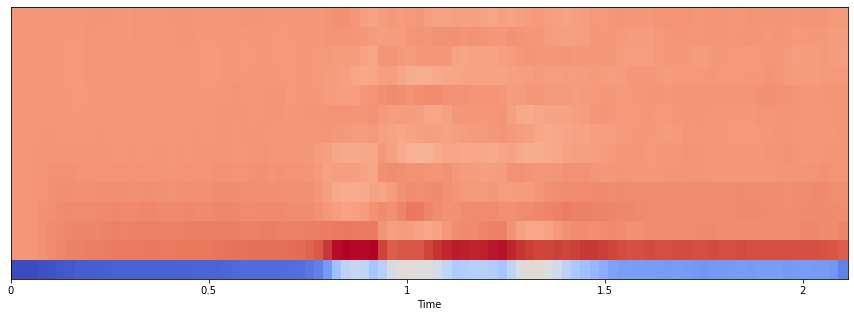

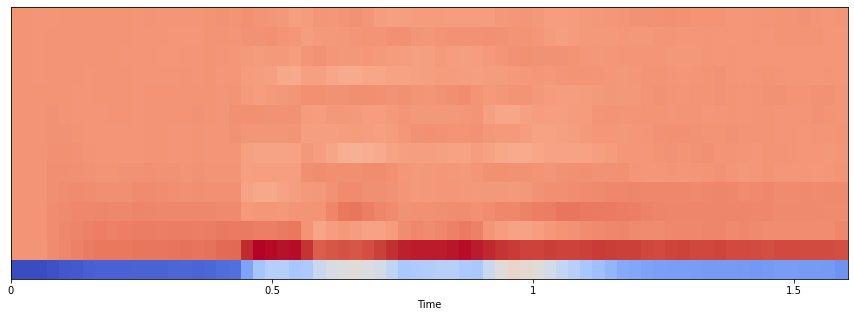

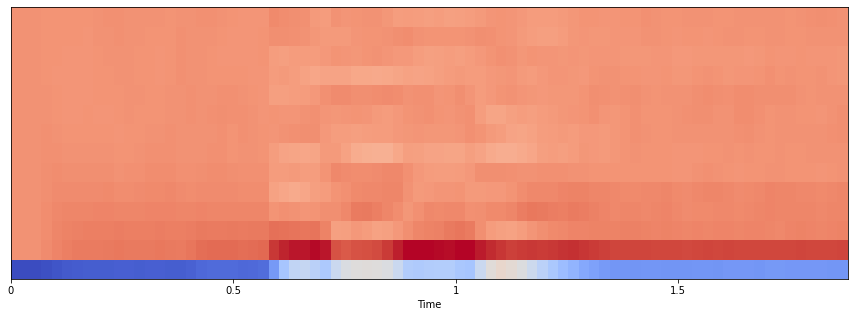

In [ ]:
# MFCC
ind=0;
for i in audio_list1:
  x, sr = librosa.load(i)
  plt.figure(figsize=(15,5))
  mfccs = librosa.feature.mfcc(x, sr=sr,n_mfcc=14)
  featuredf.iloc[ind,6:20]=np.mean(mfccs,1)
  print(mfccs.shape)
  ind=ind+1;
  librosa.display.specshow(mfccs, sr=sr, x_axis='time')

# lets save all the Features to  csv file so that we can use  it for ML

In [ ]:
featuredf.to_csv("C:/Users/Ajinkya/Downloads/Voice Authentication Project/Features.csv", header=True, index=False)  